# 🌐 Base de Données de l'Étude

## Phase 1: Récupération et Visualisation des Régions de France

Ce code télécharge les données géographiques des régions françaises, calcule leurs centroïdes et affiche une carte. Les centroïdes sont extraits pour chaque région et stockés sous forme de triplets (region, longitude, latitude) pour une utilisation ultérieure.

In [131]:
#Installation des bibliothèques nécessaires pour la récupération et la représentation des données géographiques
!pip install contextily && geopandas &&  topojson && py7zr && openpyxl && tqdm && s3fs && pandas && fiona && shapely && pyproj && rtree
!pip install PyYAML xlrd && git+https://github.com/inseefrlab/cartiflette && git+https://github.com/inseeFrLab/cartiflette.git && openmeteo-requests
!pip install requests-cache retry-requests 
!pip install geopandas 
!pip install cartiflette

'pip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'pip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'pip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'pip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'pip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.


In [132]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt

In [133]:
# Récupératoin des données 

from cartiflette import carti_download

france = carti_download(
    values=["France"],
    crs=4326,
    borders="REGION",
    vectorfile_format="geojson",
    simplification=50,
    filter_by="FRANCE_ENTIERE",
    source="EXPRESS-COG-CARTO-TERRITOIRE",
    year=2022,
)


In [134]:
france.head()

,INSEE_REG,PAYS,LIBELLE_REGION,POPULATION,SOURCE,geometry
0,1,France,Guadeloupe,384239,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-61.62648 16.27275, -61.62658 ..."
1,3,France,Guyane,281678,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-51.6408 4.21282, -51.64144 4...."
2,2,France,Martinique,364508,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-60.93246 14.7306, -60.9326 14..."
3,6,France,Mayotte,256518,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((45.08357 -12.96139, 45.08547 -..."
4,84,France,Auvergne-Rhône-Alpes,8042936,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"POLYGON ((6.06386 46.41639, 6.06267 46.4168, 6..."


In [135]:
print(france.crs)

EPSG:4326


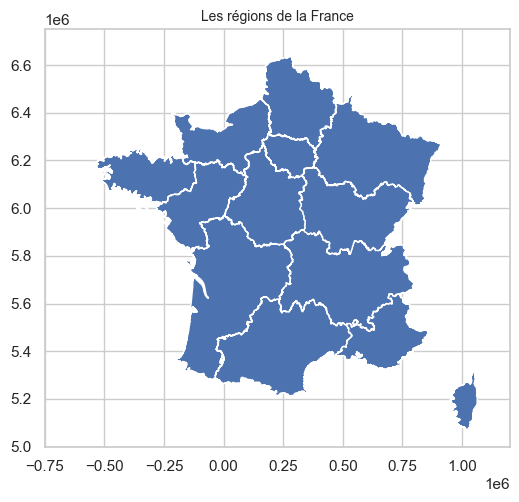

In [136]:
#REPRESENTATION 

if france.crs.to_string() != "EPSG:3857":
    france = france.to_crs(epsg=3857)
#Les  limites de la carte
xmin, xmax = -0.75e6, 1.2e6  # Convertir les limites en mètres (EPSG:3857)
ymin, ymax = 5e6, 6.75e6

#Ploting
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
france.plot(ax=ax)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
plt.title("Les régions de la France", fontsize=10)
plt.show()


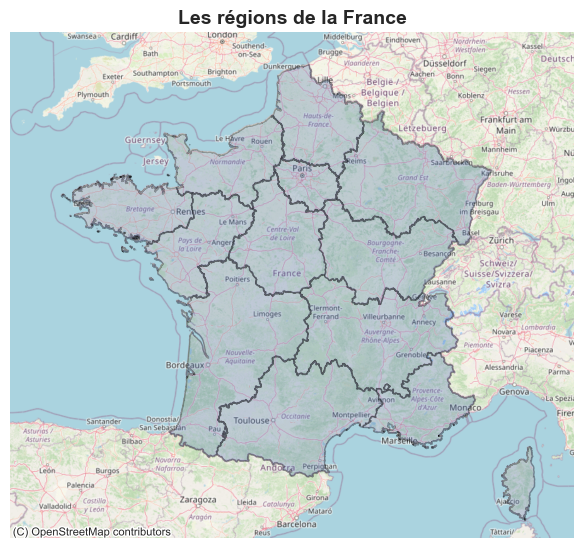

In [137]:
# Ajout d'un fond de carte pour un meilleur contexte géographique
fig, ax = plt.subplots(1, 1, figsize=(6, 6)) 
france.plot(ax=ax, edgecolor='black', linewidth=1, alpha=0.3)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
# 
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=france.crs)
#
plt.title("Les régions de la France", fontsize=14, fontweight='bold')
ax.axis('off') 

plt.tight_layout() 
plt.show()


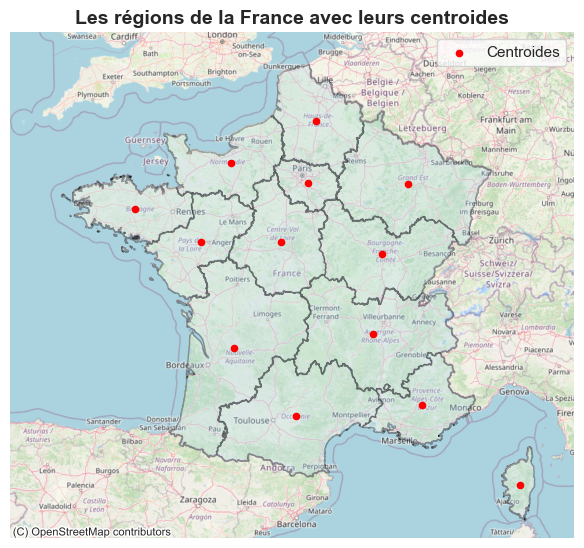

In [138]:
#Représentation des centroides 
france['centroid'] = france.geometry.centroid
france['longitude'] = france.centroid.x
france['latitude'] = france.centroid.y
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
france.plot(ax=ax, edgecolor='black', linewidth=1, alpha=0.3, color='lightblue')
ax.scatter(france['longitude'], france['latitude'], color='red', s=20, label='Centroides')
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=france.crs)
plt.title("Les régions de la France avec leurs centroides", fontsize=14, fontweight='bold')
ax.axis('off')
ax.legend()
plt.tight_layout()
plt.show()

In [139]:
# Calcul des longitudes et latitudes 
france = france.to_crs(epsg=4326)
france['longitude'] = france.geometry.centroid.x
france['latitude'] = france.geometry.centroid.y
print(france[['LIBELLE_REGION', 'longitude', 'latitude']])


                LIBELLE_REGION  longitude   latitude
0                   Guadeloupe -61.539833  16.197646
1                       Guyane -53.239940   3.915167
2                   Martinique -61.019379  14.654871
3                      Mayotte  45.147435 -12.820617
4         Auvergne-Rhône-Alpes   4.536119  45.514642
5                    Occitanie   2.143923  43.702500
6                     Bretagne  -2.841463  48.177549
7           Nouvelle-Aquitaine   0.212719  45.206040
8                    Normandie   0.110932  49.120067
9   Provence-Alpes-Côte d'Azur   6.061005  43.958789
10            Pays de la Loire  -0.816786  47.478104
11                   Grand Est   5.613112  48.688977
12     Bourgogne-Franche-Comté   4.806857  47.234282
13               Île-de-France   2.503401  48.709316
14         Centre-Val de Loire   1.684391  47.484775
15             Hauts-de-France   2.771303  49.969594
16                       Corse   9.106152  42.151511
17                  La Réunion  55.532509 -21.

C:\Users\steph\AppData\Local\Temp\ipykernel_25000\2487130668.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  france['longitude'] = france.geometry.centroid.x
C:\Users\steph\AppData\Local\Temp\ipykernel_25000\2487130668.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  france['latitude'] = france.geometry.centroid.y


In [140]:
france.head()

,INSEE_REG,PAYS,LIBELLE_REGION,POPULATION,SOURCE,geometry,centroid,longitude,latitude
0,1,France,Guadeloupe,384239,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-61.62648 16.27275, -61.62658 ...",POINT (-6850582.542 1827642.261),-61.539833,16.197646
1,3,France,Guyane,281678,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-51.6408 4.21282, -51.64144 4....",POINT (-5926644.81 436331.726),-53.239940,3.915167
2,2,France,Martinique,364508,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-60.93246 14.7306, -60.9326 14...",POINT (-6792650.367 1649468.223),-61.019379,14.654871
3,6,France,Mayotte,256518,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((45.08357 -12.96139, 45.08547 -...",POINT (5025789.843 -1439250.269),45.147435,-12.820617
4,84,France,Auvergne-Rhône-Alpes,8042936,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"POLYGON ((6.06386 46.41639, 6.06267 46.4168, 6...",POINT (504837.95 5704315.458),4.536119,45.514642


In [141]:
# Création de la liste de triplets (région, longitude, latitude)
region_centroides = []
for index, row in france.iterrows():
    region = row['LIBELLE_REGION']  # Nom de la région
    longitude = row['longitude']  # Longitude du centroïde
    latitude = row['latitude']    # Latitude du centroïde
    region_centroides.append((region, longitude, latitude)) # Ajout du triplet à la liste
region_centroides

[('Guadeloupe', -61.53983304107784, 16.197645826552904),
 ('Guyane', -53.23993971851178, 3.915166862499844),
 ('Martinique', -61.019378740773654, 14.654870858984358),
 ('Mayotte', 45.14743542382146, -12.820616875536656),
 ('Auvergne-Rhône-Alpes', 4.536118586333609, 45.51464202656834),
 ('Occitanie', 2.143922833937654, 43.70250024549978),
 ('Bretagne', -2.841462676465886, 48.17754922086023),
 ('Nouvelle-Aquitaine', 0.21271860548694332, 45.2060395396088),
 ('Normandie', 0.11093239896467046, 49.12006667987373),
 ("Provence-Alpes-Côte d'Azur", 6.061004522552231, 43.95878857291765),
 ('Pays de la Loire', -0.81678598261894, 47.47810354487287),
 ('Grand Est', 5.613112231600144, 48.68897740160863),
 ('Bourgogne-Franche-Comté', 4.806856915301157, 47.2342819451994),
 ('Île-de-France', 2.503401392552759, 48.70931550109074),
 ('Centre-Val de Loire', 1.684391322381998, 47.48477508284454),
 ('Hauts-de-France', 2.7713028658475474, 49.969593961262426),
 ('Corse', 9.106151755156151, 42.15151137562012),

## Phase 2: Collecte des Données de Qualité de l'Air 🌍

Ce script permet de collecter des **données horaires sur la qualité de l'air** via l'API Open-Meteo pour différentes régions. Il récupère les principaux polluants (**PM10**, **PM2.5**, **CO**, **NO₂**, **SO₂**, **Ozone**) ainsi que des données climatiques, et les organise dans un tableau structuré pour analyse.

---

### ✨ **Fonctionnalités Principales**
1. **Gestion de Cache** :
   - Réutilisation intelligente des données pour éviter des appels redondants à l'API.  
2. **Réessais Automatiques** :
   - Garantie de fiabilité grâce à une gestion automatique des échecs temporaires.
3. **Organisation Structurée** :
   - Utilisation de **Pandas DataFrames** pour manipuler et analyser les données de manière flexible et efficace.
4. **Extraction des Dates** :
   - Ajout d’une colonne pour isoler la **date** des données horaires.
5. **Fusion des Données** :
   - Consolidation des informations pour une analyse **centralisée et cohérente**.

---


In [142]:
from scripts import api
from scripts.api import * 

In [143]:
var_air=["pm10", "pm2_5", "carbon_dioxide", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]
combined_dataframe_air = api.recup_data("2023-01-01","2024-11-30","https://air-quality-api.open-meteo.com/v1/air-quality",var_air,region_centroides)

In [144]:
combined_dataframe_air

,date,day,region,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone
0,2023-01-01 00:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.500000,11.3,NaN,3.70,0.30,62.0
1,2023-01-01 01:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.700001,11.9,NaN,3.45,0.30,62.0
2,2023-01-01 02:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.799999,12.0,NaN,3.15,0.25,63.0
3,2023-01-01 03:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.700001,11.4,NaN,2.60,0.25,64.0
4,2023-01-01 04:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,19.400000,10.7,NaN,2.10,0.25,64.0
...,...,...,...,...,...,...,...,...,...,...,...
302395,2024-11-30 19:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,10.000000,7.1,459.0,3.60,2.50,56.0
302396,2024-11-30 20:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.800000,7.1,455.0,4.20,2.30,52.0
302397,2024-11-30 21:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.700000,7.0,453.0,4.50,2.20,49.0
302398,2024-11-30 22:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.500000,6.9,455.0,4.40,2.10,47.0


In [145]:
var_climat=["temperature_2m", "relative_humidity_2m", "precipitation", "surface_pressure", "wind_speed_10m"]
combined_dataframe_climat = api.recup_data("2023-01-01","2024-11-30","https://archive-api.open-meteo.com/v1/archive",var_climat,region_centroides)
combined_dataframe_climat = combined_dataframe_climat.drop(columns=["region","date","day"])

In [146]:
df_hourly=pd.concat([combined_dataframe_air,combined_dataframe_climat],axis=1)
df_hourly

,date,day,region,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,2023-01-01 00:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.500000,11.3,NaN,3.70,0.30,62.0,-61.539833,16.197646,23.770000,84.863304,0.0,1017.400024,9.422101
1,2023-01-01 01:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.700001,11.9,NaN,3.45,0.30,62.0,-61.539833,16.197646,23.719999,85.643173,0.0,1017.599976,9.885262
2,2023-01-01 02:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.799999,12.0,NaN,3.15,0.25,63.0,-61.539833,16.197646,23.520000,86.947586,0.0,1017.700012,9.720000
3,2023-01-01 03:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.700001,11.4,NaN,2.60,0.25,64.0,-61.539833,16.197646,23.270000,88.269188,0.0,1017.400024,7.559999
4,2023-01-01 04:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,19.400000,10.7,NaN,2.10,0.25,64.0,-61.539833,16.197646,22.469999,94.082932,0.2,1017.299988,8.825508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302395,2024-11-30 19:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,10.000000,7.1,459.0,3.60,2.50,56.0,55.532509,-21.133203,10.291500,93.833534,0.0,824.523071,3.617955
302396,2024-11-30 20:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.800000,7.1,455.0,4.20,2.30,52.0,55.532509,-21.133203,9.891500,93.814590,0.0,823.957458,3.847960
302397,2024-11-30 21:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.700000,7.0,453.0,4.50,2.20,49.0,55.532509,-21.133203,9.391500,97.342743,0.0,823.007019,3.065289
302398,2024-11-30 22:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.500000,6.9,455.0,4.40,2.10,47.0,55.532509,-21.133203,8.891500,99.663048,0.0,822.137085,2.979530


In [147]:
# Agrégation par 'day' et 'region' en prenant la moyenne
df = df_hourly.groupby(['day', 'region']).mean().reset_index()

# 📊 ANALYSE EXPLORATOIRE

Cette analyse explore les données en **panel** afin de comprendre les tendances, les relations entre variables et les spécificités régionales et temporelles. 

Elle sert également de base à la préparation des données pour la modélisation prédictive.

---

## **1. Exploration de base des données**



#### 🌍 Filtrage des Données : Régions Européennes

Dans cette étape, nous avons filtré les données pour ne conserver que les régions françaises situées en Europe. Ce filtrage est essentiel pour se concentrer sur les régions métropolitaines et éviter de mélanger les données avec celles des régions d'outre-mer.

---

    **1. Liste des Régions Européennes**
Voici les 13 régions métropolitaines françaises incluses dans l'analyse :

1. Auvergne-Rhône-Alpes  
2. Bourgogne-Franche-Comté  
3. Bretagne  
4. Centre-Val de Loire  
5. Corse  
6. Grand Est  
7. Hauts-de-France  
8. Île-de-France  
9. Normandie  
10. Nouvelle-Aquitaine  
11. Occitanie  
12. Pays de la Loire  
13. Provence-Alpes-Côte d'Azur  

In [148]:

regions_europe = ["Auvergne-Rhône-Alpes","Bourgogne-Franche-Comté","Bretagne","Centre-Val de Loire","Corse","Grand Est","Hauts-de-France","Île-de-France","Normandie","Nouvelle-Aquitaine","Occitanie","Pays de la Loire",
    "Provence-Alpes-Côte d'Azur"
]

# Filtrage des régions européennes
df1 = df[df['region'].isin(regions_europe)]



In [149]:
df1.head()

,day,region,date,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,2023-01-01,Auvergne-Rhône-Alpes,2023-01-01 11:30:00+00:00,4.536119,45.514642,14.954166,7.858334,NaN,3.475000,0.837500,62.250000,4.536119,45.514642,11.954083,71.024551,0.000000,964.791809,23.574928
1,2023-01-01,Bourgogne-Franche-Comté,2023-01-01 11:30:00+00:00,4.806857,47.234282,13.300000,7.737500,NaN,3.795833,0.741667,59.541668,4.806857,47.234282,10.743833,77.391754,0.000000,963.939941,20.494823
2,2023-01-01,Bretagne,2023-01-01 11:30:00+00:00,-2.841463,48.177549,9.845834,5.720833,NaN,3.395833,0.270833,64.916664,-2.841463,48.177549,10.547750,89.859863,0.358333,998.909729,18.512320
3,2023-01-01,Centre-Val de Loire,2023-01-01 11:30:00+00:00,1.684391,47.484775,13.750000,7.679167,NaN,2.837500,0.770833,52.958332,1.684391,47.484775,14.431666,66.970406,0.000000,1004.533508,18.958830
4,2023-01-01,Corse,2023-01-01 11:30:00+00:00,9.106152,42.151511,8.979167,5.345833,NaN,2.208333,0.341667,52.833332,9.106152,42.151511,6.793917,73.633392,0.000000,841.699280,4.792229


In [150]:
df1.shape

(9100, 18)

In [151]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9100 entries, 0 to 12599
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   day                   9100 non-null   object             
 1   region                9100 non-null   object             
 2   date                  9100 non-null   datetime64[ns, UTC]
 3   longitude             9100 non-null   float64            
 4   latitude              9100 non-null   float64            
 5   pm10                  9100 non-null   float32            
 6   pm2_5                 9100 non-null   float32            
 7   carbon_dioxide        468 non-null    float32            
 8   nitrogen_dioxide      9100 non-null   float32            
 9   sulphur_dioxide       9100 non-null   float32            
 10  ozone                 9100 non-null   float32            
 11  longitude             9100 non-null   float64            
 12  latitude  

####  🔍 Vérification de la structure des données panel

Nous allons vérifier si chaque combinaison region et day est unique

In [152]:
print(df1.groupby(['region', 'day']).size())
duplicates = df1.groupby(['region', 'day']).size()
print((duplicates > 1).sum())  # Vérifie combien de combinaisons ont plus d'une observation

region                day       
Auvergne-Rhône-Alpes  2023-01-01    1
                      2023-01-02    1
                      2023-01-03    1
                      2023-01-04    1
                      2023-01-05    1
                                   ..
Île-de-France         2024-11-26    1
                      2024-11-27    1
                      2024-11-28    1
                      2024-11-29    1
                      2024-11-30    1
Length: 9100, dtype: int64
0


### 🔍 Valeurs manquantes

In [153]:
df1.isnull().sum() / len(df1) * 100

day                      0.000000
region                   0.000000
date                     0.000000
longitude                0.000000
latitude                 0.000000
pm10                     0.000000
pm2_5                    0.000000
carbon_dioxide          94.857143
nitrogen_dioxide         0.000000
sulphur_dioxide          0.000000
ozone                    0.000000
longitude                0.000000
latitude                 0.000000
temperature_2m           0.000000
relative_humidity_2m     0.000000
precipitation            0.000000
surface_pressure         0.000000
wind_speed_10m           0.000000
dtype: float64

 **2. Observations Clés**
1. **Absence de valeurs manquantes** :  
   - La majorité des variables ne contiennent **aucune valeur manquante**, ce qui garantit une bonne qualité des données pour ces dimensions.

2. **Problème majeur avec `carbon_dioxide`** :  
   - Cette variable présente **94.86% de valeurs manquantes**, ce qui rend son utilisation directe problématique.
   - Nous allons donc supprimer cette colonne .

In [154]:
df1 = df1.drop(columns="carbon_dioxide")
df_hourly =df_hourly.drop(columns="carbon_dioxide")

## 🌍 Calcul de l'Indice ATMO

L'**indice ATMO** est utilisé en France pour évaluer la qualité de l'air en se basant sur cinq principaux polluants : **PM10**, **PM2.5**, **NO₂**, **O₃**, et **SO₂**. 

Il synthétise ces données en un indicateur unique, simple à interpréter.

---

 🛠️ **Méthode de Calcul**

 **1. Calcul des Sous-Indices**
Chaque polluant se voit attribuer un **sous-indice** en fonction de sa concentration moyenne journalière 

(ou glissante pour certains polluants). Les seuils sont définis comme suit :

| **Sous-indice** | **PM10 (µg/m³)** | **PM2.5 (µg/m³)** | **NO₂ (µg/m³)** | **O₃ (µg/m³)** | **SO₂ (µg/m³)** |
|-----------------|------------------|-------------------|-----------------|----------------|-----------------|
| 1 (Très bon)   | 0 - 6            | 0 - 5             | 0 - 29          | 0 - 29         | 0 - 39          |
| 2              | 7 - 13           | 6 - 10            | 30 - 54         | 30 - 54        | 40 - 79         |
| 3              | 14 - 20          | 11 - 15           | 55 - 84         | 55 - 79        | 80 - 119        |
| 4              | 21 - 27          | 16 - 20           | 85 - 109        | 80 - 104       | 120 - 159       |
| 5              | 28 - 34          | 21 - 25           | 110 - 134       | 105 - 129      | 160 - 199       |
| 6              | 35 - 41          | 26 - 30           | 135 - 164       | 130 - 149      | 200 - 249       |
| 7              | 42 - 49          | 31 - 40           | 165 - 199       | 150 - 179      | 250 - 299       |
| 8              | 50 - 64          | 41 - 50           | 200 - 274       | 180 - 209      | 300 - 399       |
| 9              | 65 - 79          | 51 - 75           | 275 - 399       | 210 - 239      | 400 - 499       |
| 10 (Très mauvais) | ≥ 80          | ≥ 76              | ≥ 400           | ≥ 240          | ≥ 500           |

 **2. Détermination de l'Indice Final**
L'**indice ATMO** correspond au **sous-indice le plus élevé** parmi les cinq polluants mesurés sur une journée. 

Cela signifie que le polluant le plus préoccupant domine l'indicateur global.

---

### 📊 **Échelle de Qualité de l'Air**

| **Indice ATMO** | **Niveau de Qualité** | **Couleur Associée** |
|------------------|-----------------------|-----------------------|
| 1-2             | Très bon              | 🟢 Vert clair         |
| 3-4             | Bon                   | 🟢 Vert               |
| 5               | Moyen                 | 🟡 Jaune              |
| 6-7             | Médiocre              | 🟠 Orange             |
| 8-9             | Mauvais               | 🔴 Rouge              |
| 10              | Très mauvais          | 🟣 Violet             |

---

 🔗 **Référence Officielle**
Pour plus de détails, consultez la page officielle de l'indice ATMO sur [Atmo France](https://www.atmo-france.org/article/lindice-atmo).

---


In [155]:
from scripts import indice
df_final = indice.atmo(df_hourly=df_hourly, regions=regions_europe)

In [156]:
df_final.head()

,day,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
2800,2023-01-01,Auvergne-Rhône-Alpes,14.954166,7.858334,3.475000,65.125,0.837500,11.954083,71.024551,0.000000,964.791809,23.574928,3,2,1,3,1,3
2801,2023-01-02,Auvergne-Rhône-Alpes,14.316667,7.962500,5.904167,71.000,0.933333,10.583250,76.024849,0.550000,965.794250,15.330505,3,2,1,3,1,3
2802,2023-01-03,Auvergne-Rhône-Alpes,8.666667,6.525000,11.420834,53.750,0.729167,6.727000,87.053253,0.125000,971.449707,5.034335,2,2,1,2,1,2
2803,2023-01-04,Auvergne-Rhône-Alpes,15.504167,11.441667,17.929167,37.875,1.075000,5.220750,84.029167,0.000000,972.121399,4.557892,3,3,1,2,1,3
2804,2023-01-05,Auvergne-Rhône-Alpes,11.616666,9.070833,12.416667,44.375,0.725000,7.531167,89.476860,0.016667,968.975586,5.073804,2,2,1,2,1,2


In [157]:
df_final.describe()

,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
count,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.00000,9100.0,9100.000000
mean,10.907528,7.113768,4.518834,74.675422,0.442049,12.377439,76.972610,0.120589,977.221863,11.768193,2.212088,1.888681,1.003626,3.31989,1.0,3.498791
std,6.222834,4.548127,4.211990,17.035211,0.446411,6.485336,11.364951,0.240779,48.221287,5.837454,0.929465,0.981320,0.060113,0.74320,0.0,0.790160
min,1.141667,0.850000,0.508333,17.125000,0.000000,-7.760250,20.433760,0.000000,806.494568,1.490240,1.000000,1.000000,1.000000,1.00000,1.0,2.000000
25%,6.933333,4.200000,2.070833,64.250000,0.166667,7.808958,70.551474,0.000000,961.561111,7.297564,2.000000,1.000000,1.000000,3.00000,1.0,3.000000
50%,9.341666,5.795834,3.135417,73.875000,0.308333,12.212584,78.623955,0.016667,994.546631,10.590815,2.000000,2.000000,1.000000,3.00000,1.0,3.000000
75%,13.070834,8.529166,5.433333,84.781250,0.562500,17.388834,85.422457,0.137500,1006.645447,15.156949,3.000000,2.000000,1.000000,4.00000,1.0,4.000000
max,83.650002,42.333332,52.420834,161.500000,6.408333,30.983335,99.779869,3.450000,1038.322388,41.020008,10.000000,8.000000,2.000000,7.00000,1.0,10.000000


### 📊 Statistiques Descriptives des Régions Européennes

Les statistiques ci-dessous présentent un résumé des variables clés collectées pour les 13 régions métropolitaines françaises sur la période donnée.

---

#### **1. Pollution Atmosphérique**

| **Variable**            | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|--------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **PM10** (µg/m³)         | 9,100     | 10.91    | 6.22     | 1.14      | 6.93      | 9.34      | 13.07     | 83.65     |
| **PM2.5** (µg/m³)        | 9,100     | 7.11     | 4.55     | 0.85      | 4.20      | 5.80      | 8.53      | 42.33     |
| **Dioxyde d'Azote** (µg/m³) | 9,100  | 4.52     | 4.21     | 0.51      | 2.07      | 3.14      | 5.43      | 52.42     |
| **Ozone** (µg/m³)        | 9,100     | 74.68    | 17.03    | 17.13     | 64.25     | 73.88     | 84.78     | 161.50    |
| **Dioxyde de Soufre** (µg/m³) | 9,100 | 0.44     | 0.45     | 0.00      | 0.17      | 0.31      | 0.56      | 6.41      |
| **Monoxyde de Carbone** (µg/m³) | 9,100 | 154.63 | 31.88    | 87.92     | 132.86    | 150.21    | 169.46    | 428.00    |
---

#### **2. Variables Météorologiques**

| **Variable**                | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|-----------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Température à 2m** (°C)   | 9,100     | 12.38    | 6.49     | -7.76     | 7.81      | 12.21     | 17.39     | 30.98     |
| **Humidité Relative** (%)   | 9,100     | 76.97    | 11.36    | 20.43     | 70.55     | 78.62     | 85.42     | 99.78     |
| **Pression au Sol** (hPa)   | 9,100     | 977.22   | 48.22    | 806.49    | 961.56    | 994.55    | 1006.65   | 1038.32   |
| **Vent à 10m** (m/s)        | 9,100     | 11.77    | 5.84     | 1.49      | 7.30      | 10.59     | 15.16     | 41.02     |

---

#### **3. Variables du Sol**

| **Variable**                       | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|------------------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Température du Sol (0-7cm)** (°C)| 9,100     | 12.68    | 6.60     | -3.18     | 7.90      | 12.43     | 17.87     | 31.14     |
| **Humidité du Sol (0-7cm)** (m³/m³)| 9,100     | 0.33     | 0.08     | 0.06      | 0.28      | 0.35      | 0.39      | 0.51      |

---

#### **4. Sous-Indices et Indice ATMO**

| **Variable**            | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|--------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Sous-indice PM10**     | 9,100     | 2.21     | 0.93     | 1.00      | 2.00      | 2.00      | 3.00      | 10.00     |
| **Sous-indice PM2.5**    | 9,100     | 1.89     | 0.98     | 1.00      | 1.00      | 2.00      | 2.00      | 8.00      |
| **Sous-indice NO2**      | 9,100     | 1.00     | 0.06     | 1.00      | 1.00      | 1.00      | 1.00      | 2.00      |
| **Sous-indice O3**       | 9,100     | 3.32     | 0.74     | 1.00      | 3.00      | 3.00      | 4.00      | 7.00      |
| **Sous-indice SO2**      | 9,100     | 1.00     | 0.00     | 1.00      | 1.00      | 1.00      | 1.00      | 1.00      |
| **Indice ATMO**          | 9,100     | 3.50     | 0.79     | 2.00      | 3.00      | 3.00      | 4.00      | 10.00     |

---

#### **Observations Clés**
1. **Polluants :**
   - Les **PM10** et **PM2.5** ont des moyennes modérées mais des maximums élevés, reflétant des pics de pollution dans certaines régions.
   - Les sous-indices pour le **dioxyde de soufre** restent constants à `1`, indiquant des concentrations très faibles dans toutes les régions.

2. **Météorologie :**
   - La **température moyenne** à 2m est d'environ 12.4°C, avec des variations saisonnières marquées.
   - Le vent est modéré en moyenne, mais des rafales atteignant 41 m/s ont été observées.

3. **Indice ATMO :**
   - La majorité des jours ont un indice ATMO de `3` ou `4`, correspondant à une qualité de l'air moyenne ou légèrement médiocre.
   - Quelques jours présentent un indice ATMO élevé (`10`), indiquant une qualité de l'air très mauvaise.



In [158]:
df1=df_final

In [159]:
df1.insert(1,"month",df["date"].dt.month)
month_dict = {
    1: 'janvier', 2: 'février', 3: 'mars', 4: 'avril', 5: 'mai', 
    6: 'juin', 7: 'juillet', 8: 'août', 9: 'septembre', 10: 'octobre', 
    11: 'novembre', 12: 'décembre'
}

In [160]:
df1.head()

,day,month,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
2800,2023-01-01,6,Auvergne-Rhône-Alpes,14.954166,7.858334,3.475000,65.125,0.837500,11.954083,71.024551,0.000000,964.791809,23.574928,3,2,1,3,1,3
2801,2023-01-02,6,Auvergne-Rhône-Alpes,14.316667,7.962500,5.904167,71.000,0.933333,10.583250,76.024849,0.550000,965.794250,15.330505,3,2,1,3,1,3
2802,2023-01-03,6,Auvergne-Rhône-Alpes,8.666667,6.525000,11.420834,53.750,0.729167,6.727000,87.053253,0.125000,971.449707,5.034335,2,2,1,2,1,2
2803,2023-01-04,6,Auvergne-Rhône-Alpes,15.504167,11.441667,17.929167,37.875,1.075000,5.220750,84.029167,0.000000,972.121399,4.557892,3,3,1,2,1,3
2804,2023-01-05,6,Auvergne-Rhône-Alpes,11.616666,9.070833,12.416667,44.375,0.725000,7.531167,89.476860,0.016667,968.975586,5.073804,2,2,1,2,1,2


### 📈    Visualisation des Tendances Temporelles des Polluants Atmosphériques

In [161]:
import seaborn as sns
import matplotlib.pyplot as plt
import scripts
from scripts import dataviz

In [162]:
polluants = ['pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide']
time_trends = df_final.groupby('day')[polluants].mean()

c:\Users\steph\Documents\ENSAE\Python pour la data science\Projet_Python_2024-1\scripts\dataviz.py:60: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\steph\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\steph\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


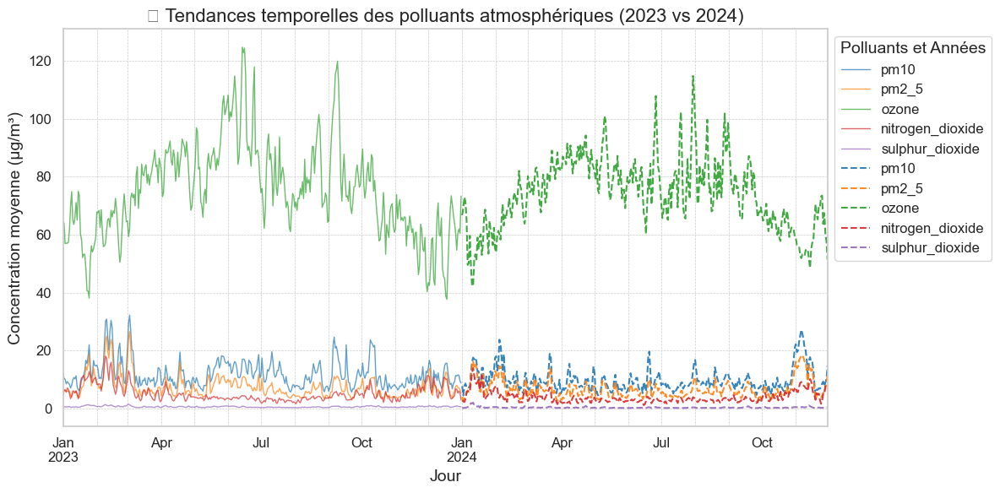

In [163]:
time_trends.index = pd.to_datetime(time_trends.index)
time_trends_2023 = time_trends.loc['2023-01-01':'2023-12-31']
time_trends_2024 = time_trends.loc['2024-01-01':'2024-12-31']
dataviz.time_series_france(polluants,time_trends_2023,time_trends_2024)

1. **Ozone (O₃)** :
   - Les concentrations d'ozone suivent une **forte saisonnalité**, atteignant des pics au printemps et en été. 
   - Ces pics pourraient être dus à une augmentation de la photodissociation des polluants en présence de lumière solaire intense.

2. **PM10 et PM2.5** :
   - Les concentrations de particules (PM10 et PM2.5) sont relativement stables sur l'année, avec quelques **pics sporadiques** qui pourraient être liés à des événements ponctuels, comme des feux de forêt, des émissions industrielles, ou des conditions météorologiques spécifiques (vents secs, inversion thermique).
   - Les niveaux sont légèrement plus élevés en hiver, possiblement en raison des émissions provenant du chauffage résidentiel.

3. **Dioxyde d'azote (NO₂)** :
   - Les niveaux de NO₂ sont faibles mais montrent une légère hausse en hiver. Cela pourrait être attribué à une augmentation des émissions liées au transport et au chauffage.

4. **Dioxyde de soufre (SO₂)** :
   - Les concentrations de SO₂ restent très faibles tout au long de l'année. Les faibles émissions pourraient être liées à des régulations strictes sur les combustibles fossiles contenant du soufre.

##### ✨ Comparaison entre 2023 et 2024
- **Tendances générales similaires** :
  - Les deux années montrent des profils de variation similaires, suggérant une cohérence dans les sources d'émission et les conditions météorologiques.
- **Légères différences dans les niveaux de concentration** :
  - Pour certains polluants comme l'ozone, les niveaux de 2024 semblent légèrement inférieurs à ceux de 2023, ce qui pourrait être dû à des variations climatiques ou des politiques environnementales renforcées.

##### 📌 Points Clés à Retenir
- Les concentrations d'ozone présentent une **forte saisonnalité** et des pics marqués en été.
- Les particules fines (PM10 et PM2.5) montrent des **fluctuations ponctuelles** et des niveaux légèrement plus élevés en hiver.
- Les concentrations de NO₂ et SO₂ restent relativement faibles, avec peu de variations notables.

### 🧐 Vérifions si ces tendances sont égalements observées dans chaque région

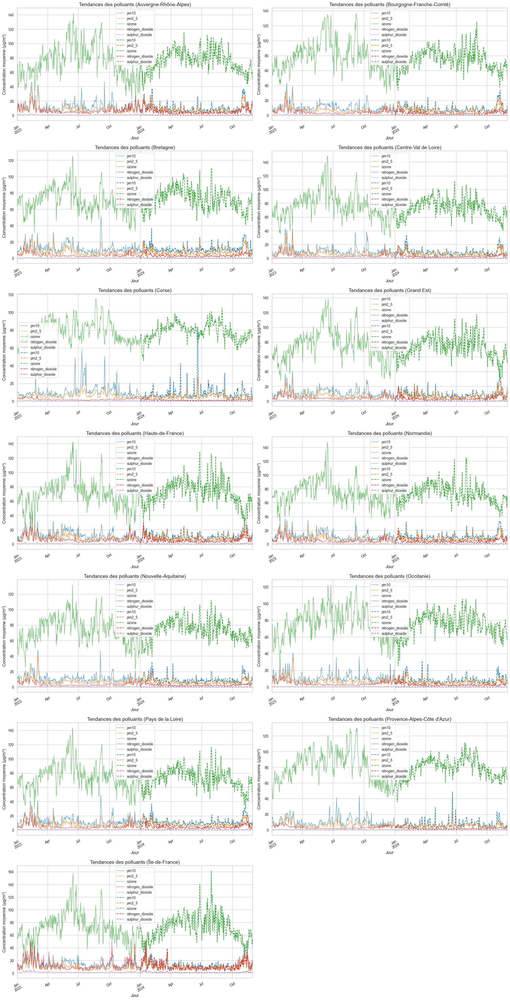

In [164]:
dataviz.time_series_regions(polluants, df_final)

In [165]:
df1.head()

,day,month,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
2800,2023-01-01,6,Auvergne-Rhône-Alpes,14.954166,7.858334,3.475000,65.125,0.837500,11.954083,71.024551,0.000000,964.791809,23.574928,3,2,1,3,1,3
2801,2023-01-02,6,Auvergne-Rhône-Alpes,14.316667,7.962500,5.904167,71.000,0.933333,10.583250,76.024849,0.550000,965.794250,15.330505,3,2,1,3,1,3
2802,2023-01-03,6,Auvergne-Rhône-Alpes,8.666667,6.525000,11.420834,53.750,0.729167,6.727000,87.053253,0.125000,971.449707,5.034335,2,2,1,2,1,2
2803,2023-01-04,6,Auvergne-Rhône-Alpes,15.504167,11.441667,17.929167,37.875,1.075000,5.220750,84.029167,0.000000,972.121399,4.557892,3,3,1,2,1,3
2804,2023-01-05,6,Auvergne-Rhône-Alpes,11.616666,9.070833,12.416667,44.375,0.725000,7.531167,89.476860,0.016667,968.975586,5.073804,2,2,1,2,1,2


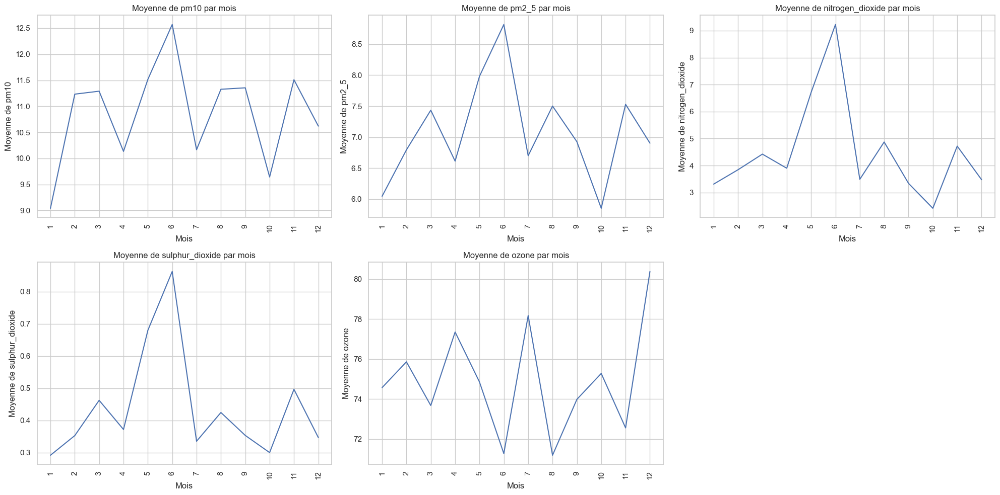

In [166]:
variables_air_month=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone","month"]
dataviz.plot_monthly_averages(df1,variables_air_month)

In [167]:
variables_air_region=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone","region"]
df_air_region=df_final[variables_air_region].groupby(["region"]).mean()


In [168]:
df_air_region

,pm10,pm2_5,nitrogen_dioxide,sulphur_dioxide,ozone
region,,,,,
Auvergne-Rhône-Alpes,11.391398,8.019738,6.163274,0.549964,75.628952
Bourgogne-Franche-Comté,9.689458,6.438536,3.534101,0.337881,76.773442
Bretagne,11.905880,7.311768,3.597988,0.318262,71.608891
Centre-Val de Loire,9.917185,6.694089,3.169827,0.282143,74.808233
Corse,9.848196,5.443572,1.727952,0.332905,78.523585
Grand Est,10.403630,7.027137,4.012548,0.412583,74.597988
Hauts-de-France,12.268559,8.227059,6.272761,0.555869,70.917417
Normandie,11.407137,7.601459,4.785083,0.499726,73.473682
Nouvelle-Aquitaine,10.411905,6.652667,3.004595,0.309143,73.582500


In [169]:
df_air_region["LIBELLE_REGION"] = df_air_region.index
gd=france.merge(df_air_region, on="LIBELLE_REGION",how="inner")

In [170]:
gd=gd.to_crs(3857)

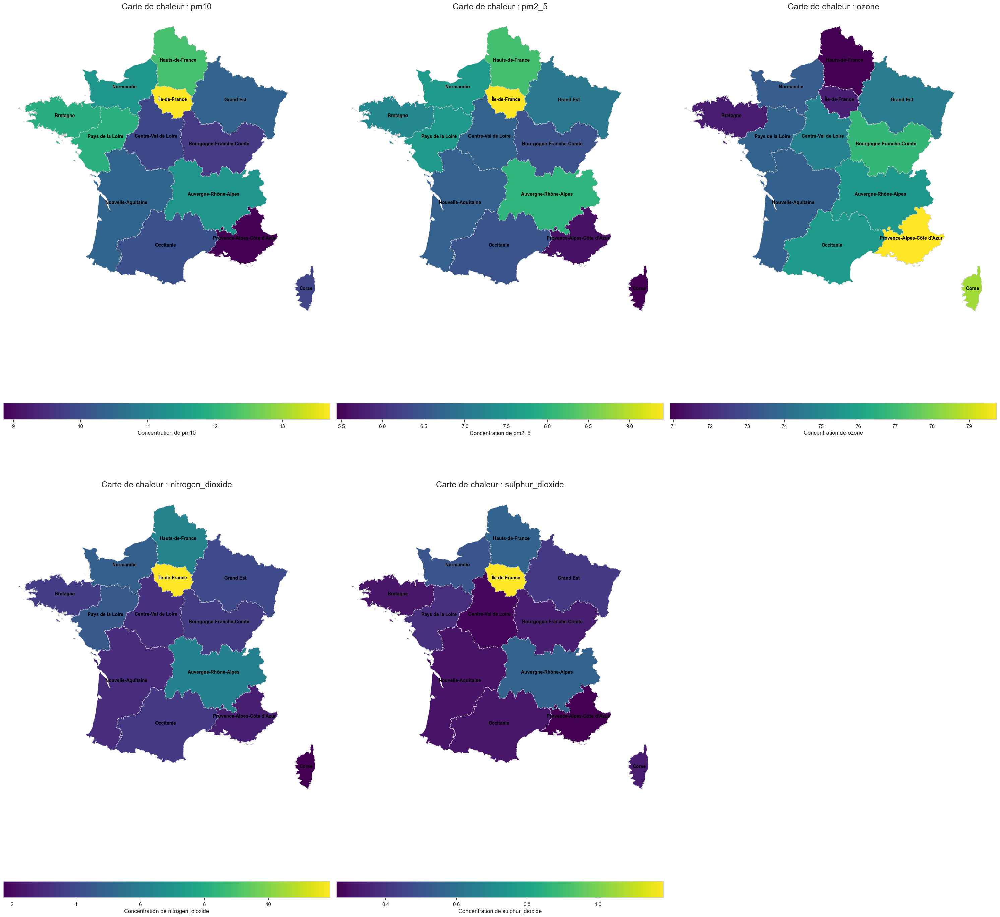

In [171]:
polluants = ['pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide']
dataviz.plot_pollutants(gd,polluants)

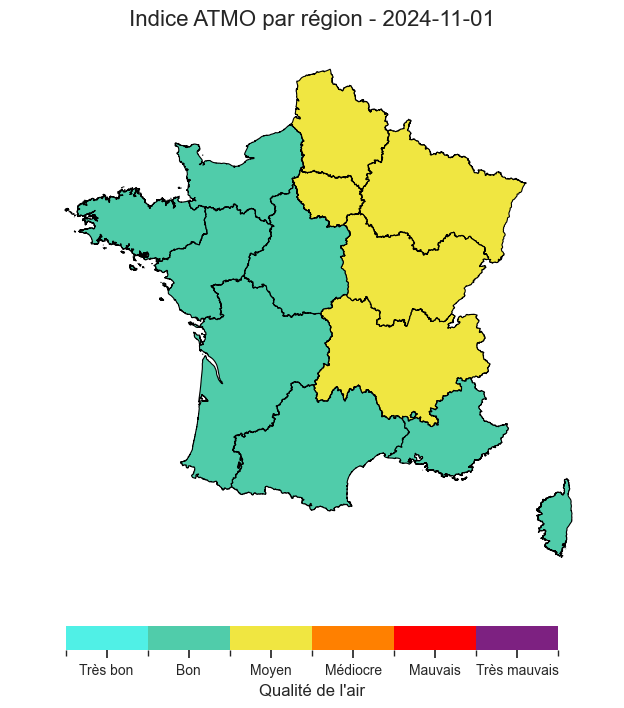

In [172]:
dataviz.plot_indice_atmo(df_final,france,"2024-11-01" )

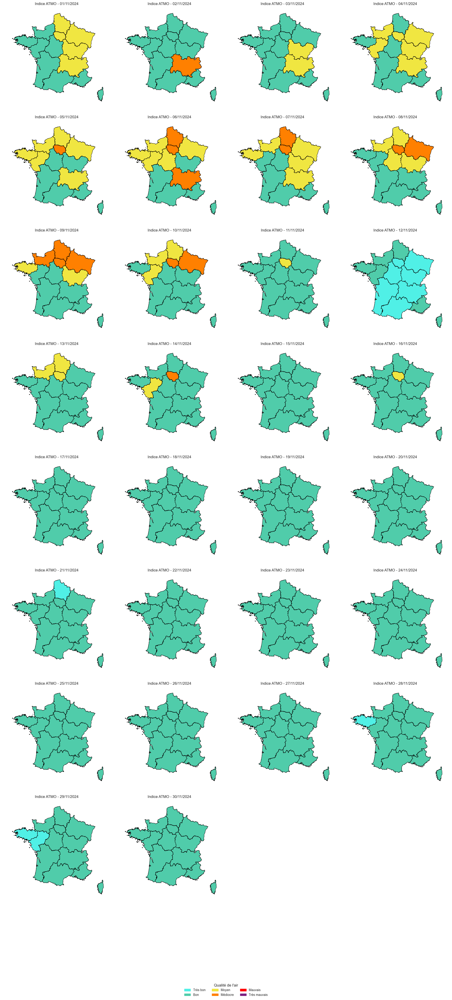

In [173]:
dataviz.plot_atmo_maps(df_final, france, start_date="2024-11-01", end_date="2024-11-30")

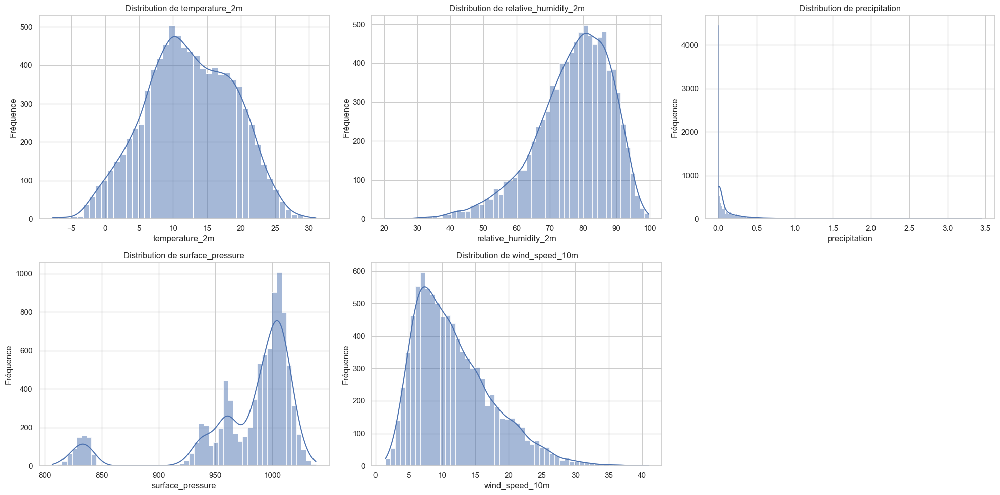

In [174]:
var_climat = ["temperature_2m", "relative_humidity_2m", 
              "precipitation", "surface_pressure", "wind_speed_10m"]

dataviz.plot_climatic_histograms(
    df=df_final, 
    var_climat=var_climat, 
    n_cols=3, 
    width=20, 
    height_per_row=5)

Text(0.5, 1.0, 'Matrice de Corrélation')

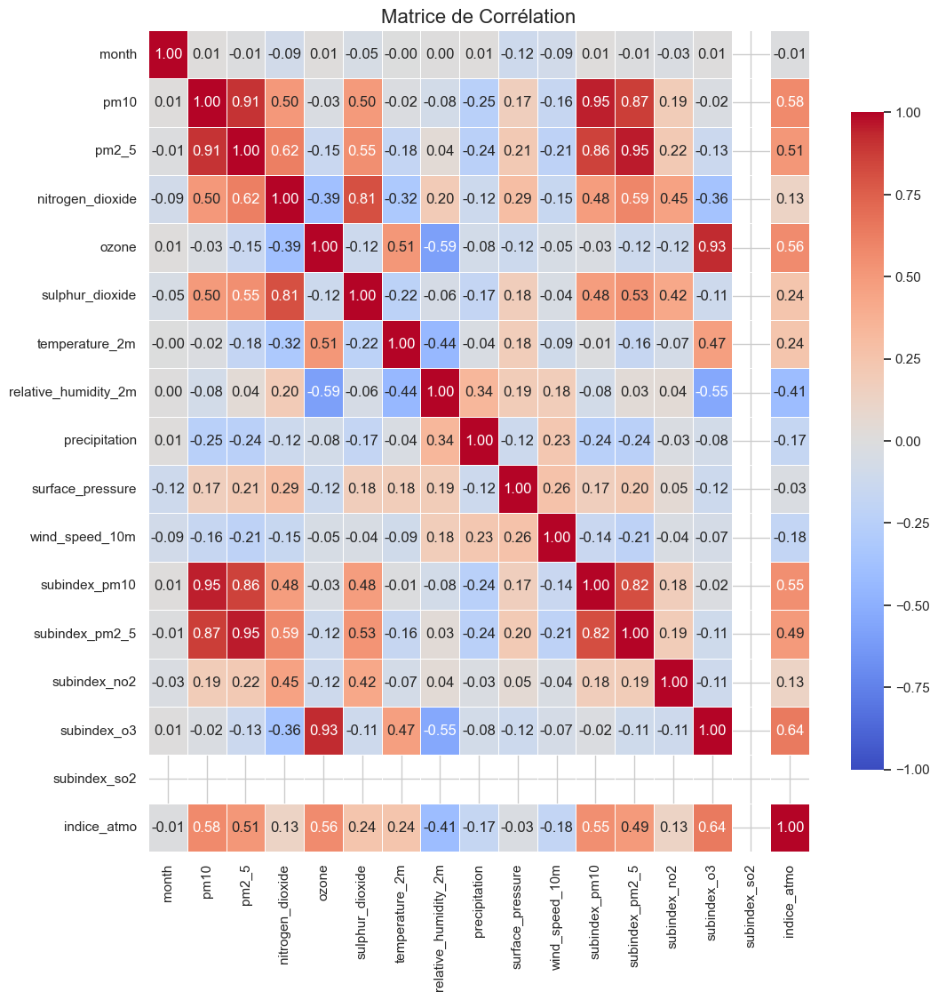

In [175]:
import numpy as np
corr_matrix = df_final.select_dtypes(include=[np.number]).corr()
plt.figure(figsize=(12, 12))  # Taille de la figure
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, 
            linewidths=0.5, fmt='.2f', cbar_kws={'shrink': 0.8})

# Titre
plt.title('Matrice de Corrélation', fontsize=16)

## MODELISATION

Après une description approfondie de la base de données en général et de la qualité de l'air en particulier, nous allons procéder à une tentative de modélisation des chroniques des variables de qualité de l'air en Ile de France. Ce choix géographique se justifie par le fait qu'elle apparit comme la région la plus peuplée de France et aussi celle qui présente les résultats les plus inquietants en terme de qualité de l'air.

Cette partie se fera en 4 étapes :
* Modélisation des chroniques de qualité de l'air individuellement grace à un modèle de type ARIMA (ARIMA)
* Modélisation groupée des chroniques de qualité de l'air en utilisant un modèle VAR (VAR1)
* Modélisation groupée des chroniques de qualité de l'air en utilisant un modèle VAR intégrant les variables climatiques (VAR2)
* Une évaluation des prévisions faites par les 3 modèles

In [176]:
!pip install scikit-learn
!pip install statsmodels

'pip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'pip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.


In [177]:
df_idf = df_final[df_final["region"]=="Île-de-France"]
df_idf

,day,month,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
9100,2023-01-01,5,Île-de-France,15.383334,9.358334,7.616667,55.000000,1.375000,13.652084,71.534920,0.079167,1009.788025,19.753124,3,2,1,3,1,3
9101,2023-01-02,5,Île-de-France,9.312500,6.445833,16.291666,57.625000,1.337500,10.062500,89.010780,0.404167,1015.033752,13.947431,2,2,1,3,1,3
9102,2023-01-03,5,Île-de-France,11.849999,7.379167,13.200000,54.125000,1.141667,7.752083,91.482140,0.062500,1022.744385,16.570414,2,2,1,3,1,3
9103,2023-01-04,5,Île-de-France,5.800000,3.862500,7.841667,64.000000,1.187500,11.695834,89.660561,0.112500,1019.289001,25.613174,1,1,1,3,1,3
9104,2023-01-05,5,Île-de-France,6.237500,4.679166,14.345833,60.666667,1.300000,12.356251,88.560097,0.020833,1019.476074,15.305164,2,1,1,3,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9795,2024-11-26,6,Île-de-France,12.691667,8.512500,13.220833,57.375000,0.916667,8.658334,88.946800,0.108333,1014.152649,11.292778,2,2,1,3,1,3
9796,2024-11-27,6,Île-de-France,7.362500,5.725000,11.762500,62.750000,0.775000,10.439584,91.109230,0.254167,1012.352295,17.599253,2,2,1,3,1,3
9797,2024-11-28,6,Île-de-France,14.870833,12.295834,19.445833,45.000000,1.537500,6.358334,84.380318,0.004167,1022.028015,6.830119,3,3,1,2,1,3
9798,2024-11-29,6,Île-de-France,14.041667,11.537499,12.087501,53.250000,0.920833,3.558333,85.608681,0.000000,1023.345276,9.613878,3,3,1,2,1,3


In [178]:
df_idf.shape

(700, 19)

## Modelisation ARIMA

La modélisation ARIMA se fait comme suit :
* Etude de la stationarité de la série
* Si elle est stationaire, on détermine "visuellement" grâce au graphe des autocorrelations simples et autocorrelations partielles, les paramètres du modèle 
* On entraine le modèle sur les données
* On fait des prévisions pour des valeurs futures


### ARIMA pm10

La série est stationnaire.


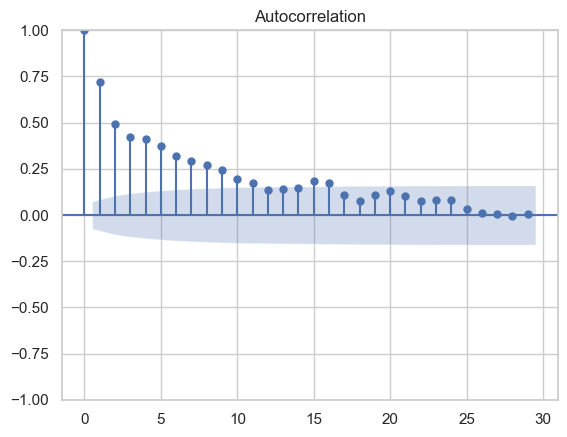

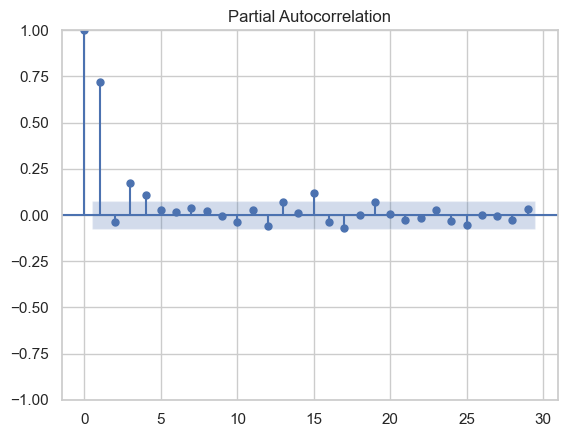

In [179]:

from scripts import modele
modele.stationarity_acf(df_idf,"pm10")



c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


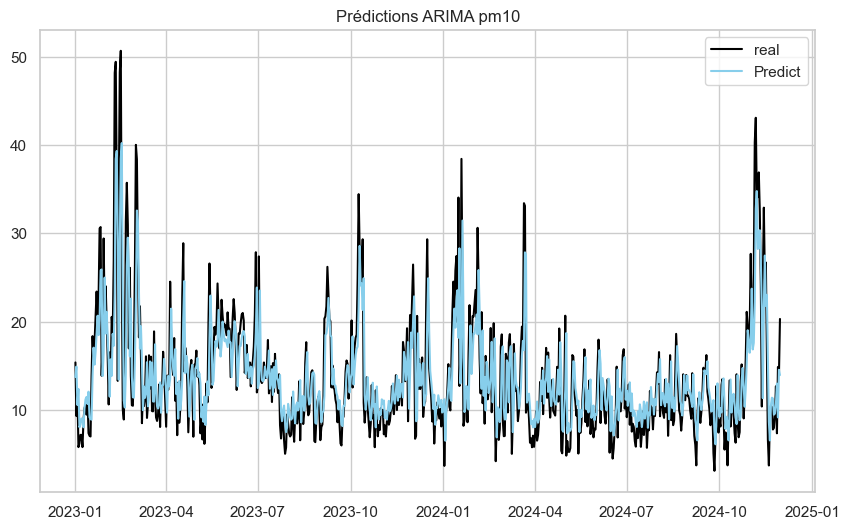

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


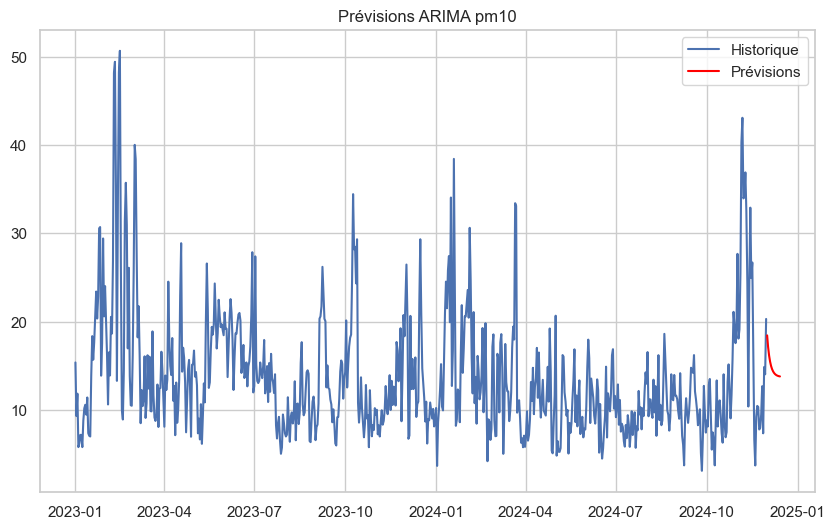

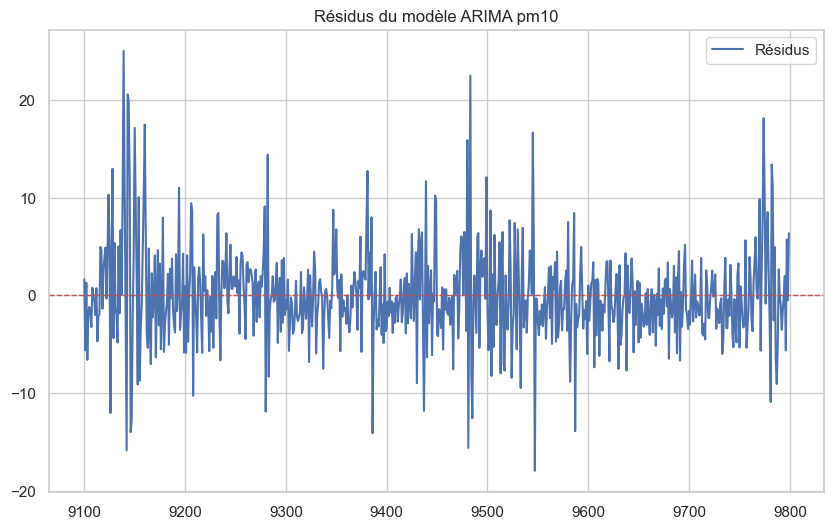

In [180]:
model_fit_pm10 = modele.fit_arima(df_idf,"pm10",1,0,0)
modele.prediction_arima(df_idf,"pm10",model_fit_pm10)
forecast_pm10 = modele.prevision_arima(df_idf,"pm10",model_fit_pm10)
modele.residus(df_idf,"pm10",model_fit_pm10)

### ARIMA pm2_5

La série est stationnaire.


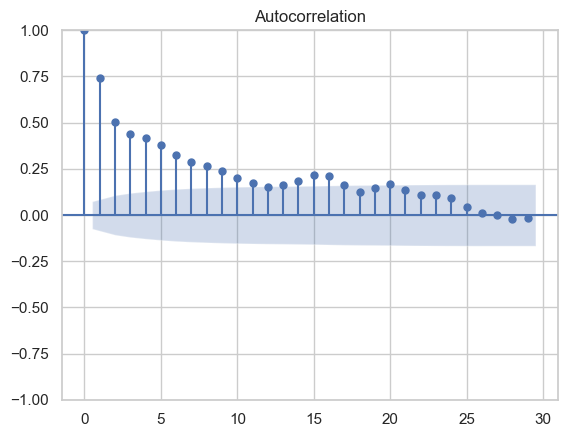

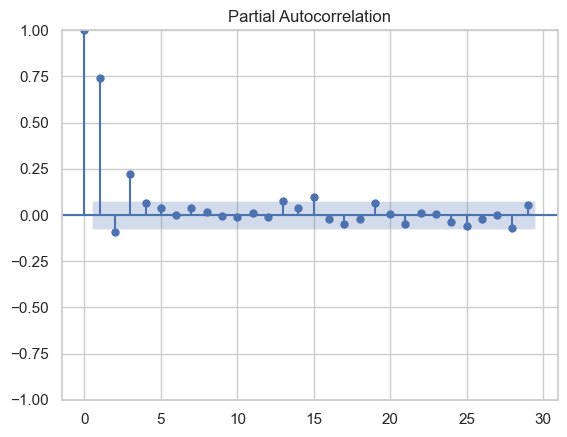

In [181]:

from scripts import modele
modele.stationarity_acf(df_idf,"pm2_5")



c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


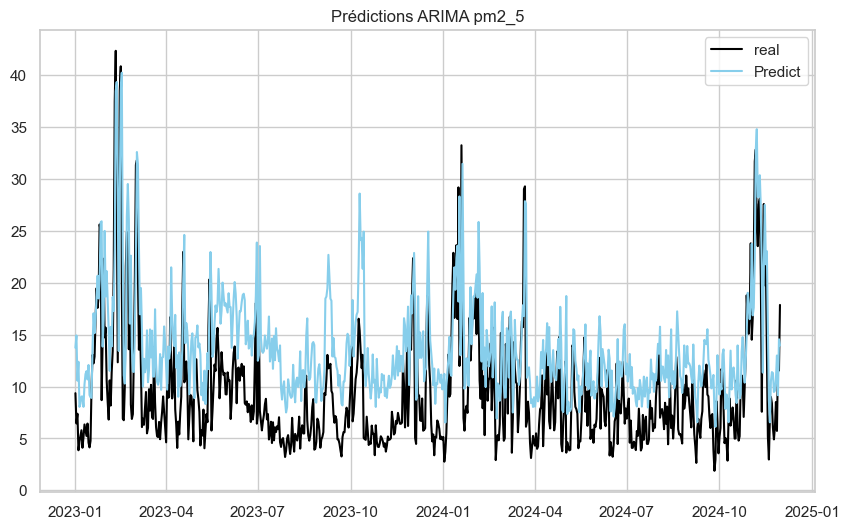

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


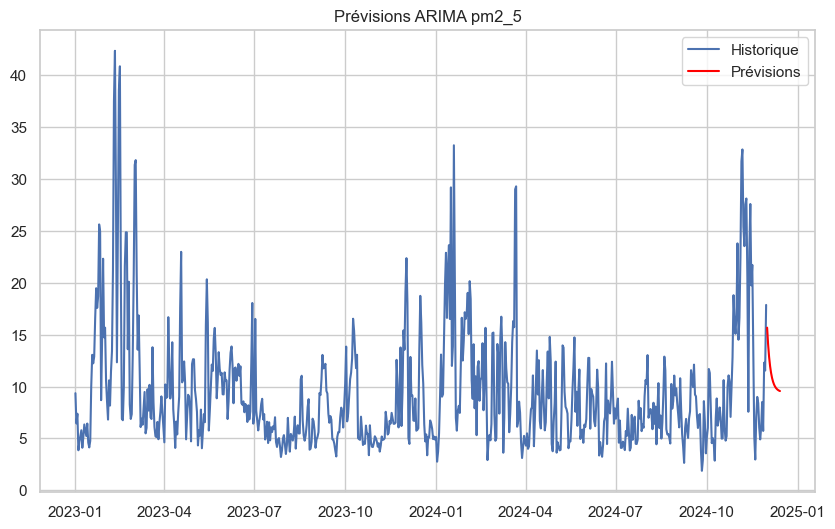

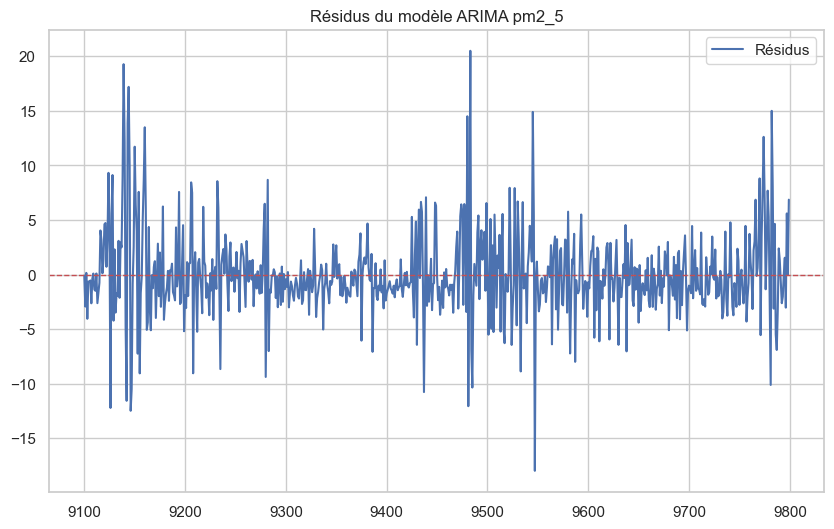

In [182]:
model_fit_pm2_5 = modele.fit_arima(df_idf,"pm2_5",1,0,0)
modele.prediction_arima(df_idf,"pm2_5",model_fit_pm10)
forecast_pm2_5 = modele.prevision_arima(df_idf,"pm2_5",model_fit_pm2_5)
modele.residus(df_idf,"pm2_5",model_fit_pm2_5)

### ARIMA ozone

La série n'est pas stationnaire.


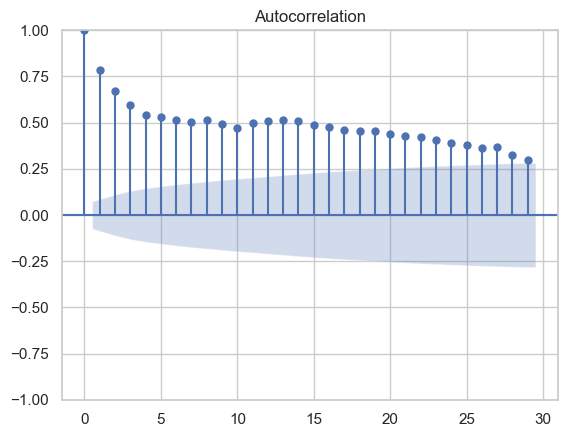

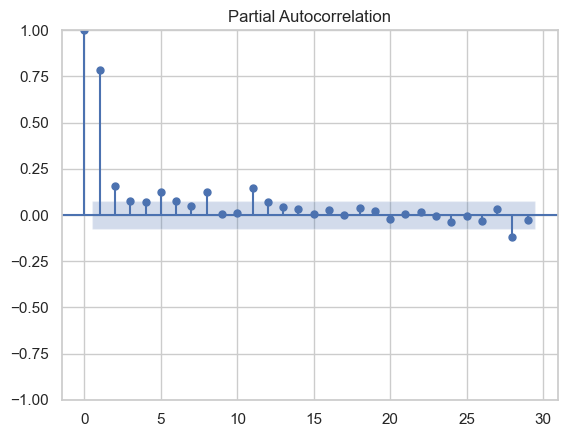

In [183]:
from scripts import modele
modele.stationarity_acf(df_idf,"ozone")

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


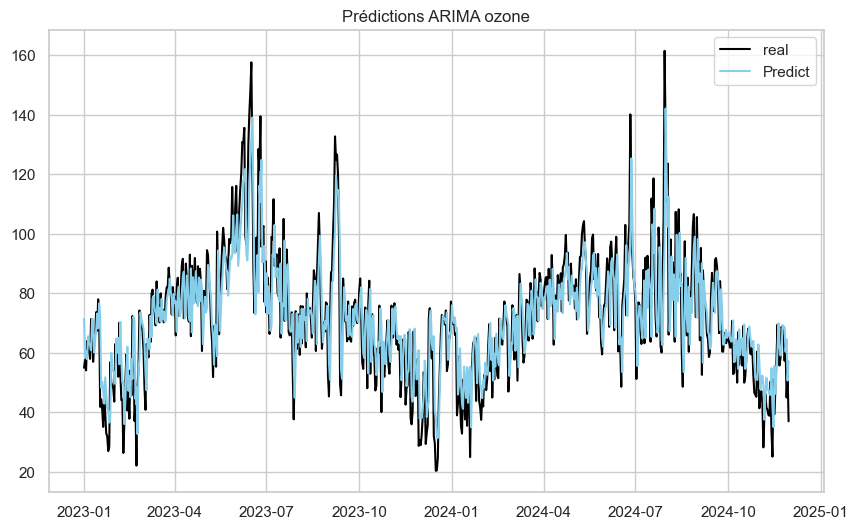

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


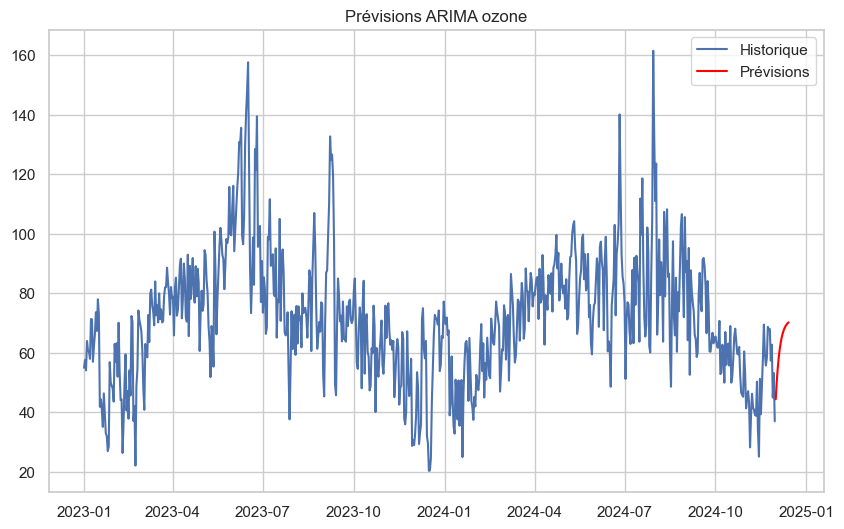

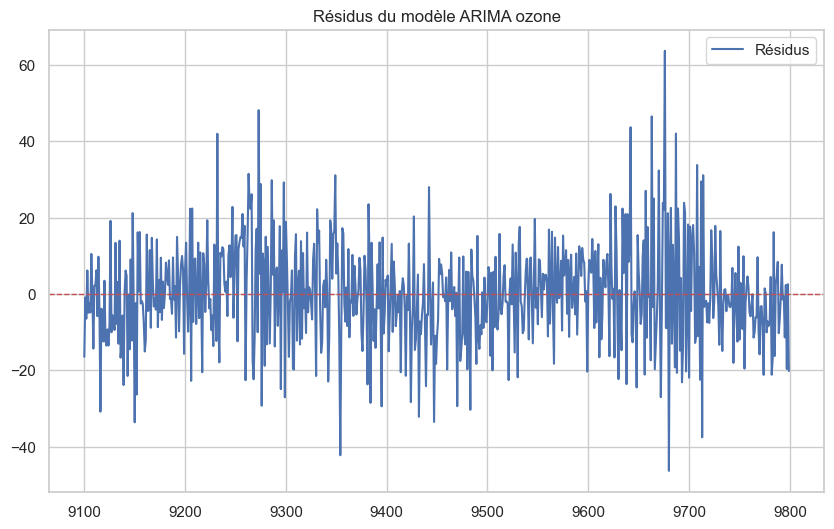

In [184]:
model_fit_ozone = modele.fit_arima(df_idf,"ozone",1,0,0)
modele.prediction_arima(df_idf,"ozone",model_fit_ozone)
forecast_ozone = modele.prevision_arima(df_idf,"ozone",model_fit_ozone)
modele.residus(df_idf,"ozone",model_fit_ozone)

### ARIMA nitrogen_dioxide

La série est stationnaire.


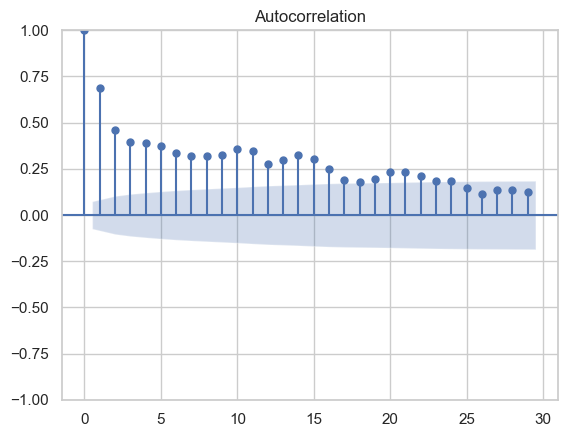

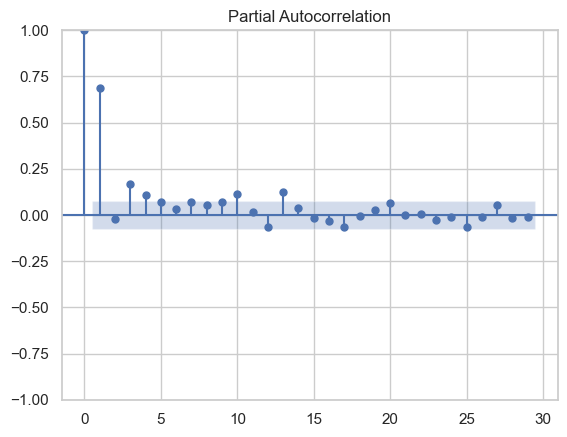

In [185]:

from scripts import modele
modele.stationarity_acf(df_idf,"nitrogen_dioxide")



c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


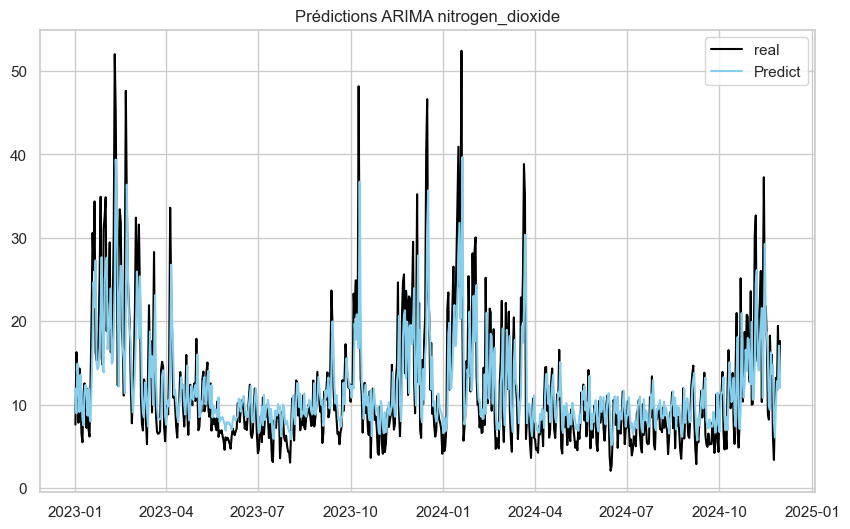

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


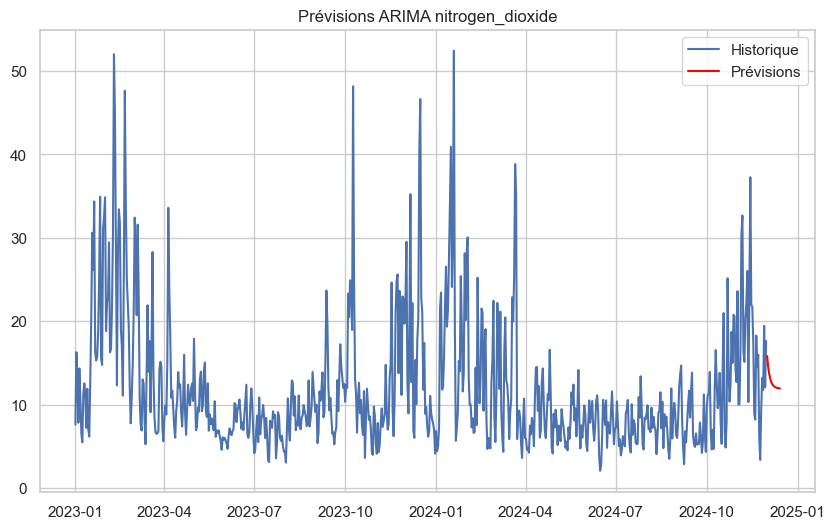

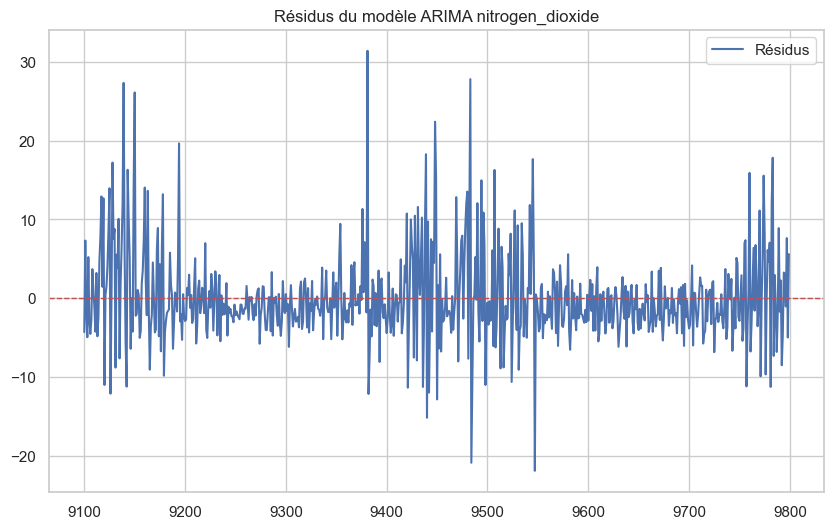

In [186]:
model_fit_nitrogen_dioxide = modele.fit_arima(df_idf,"nitrogen_dioxide",1,0,0)
modele.prediction_arima(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)
forecast_nitrogen_dioxide = modele.prevision_arima(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)
modele.residus(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)

### ARIMA sulphur_dioxide

La série est stationnaire.


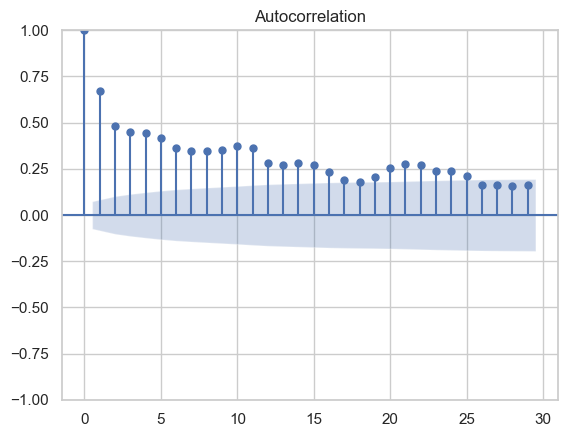

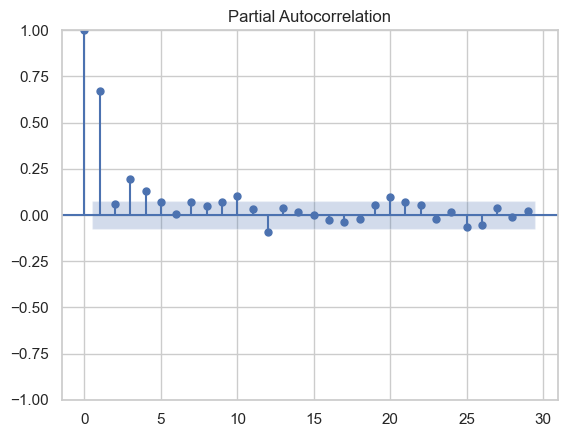

In [187]:
from scripts import modele
modele.stationarity_acf(df_idf,"sulphur_dioxide")

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


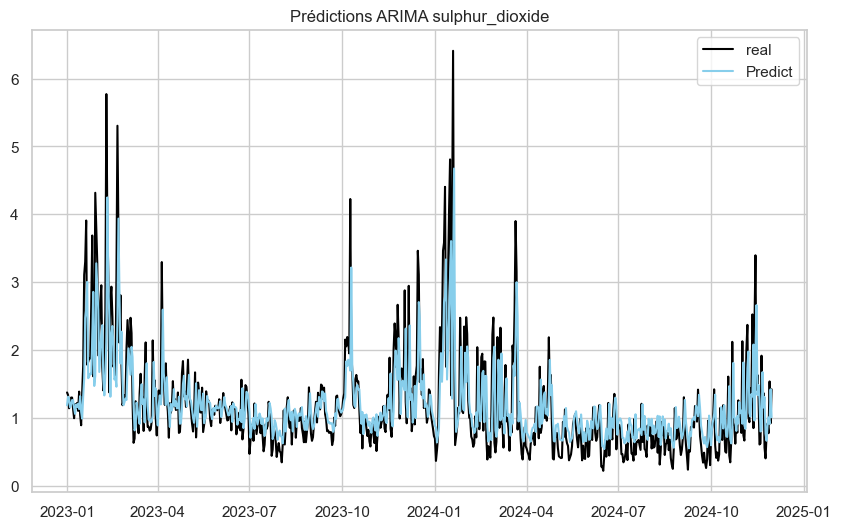

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


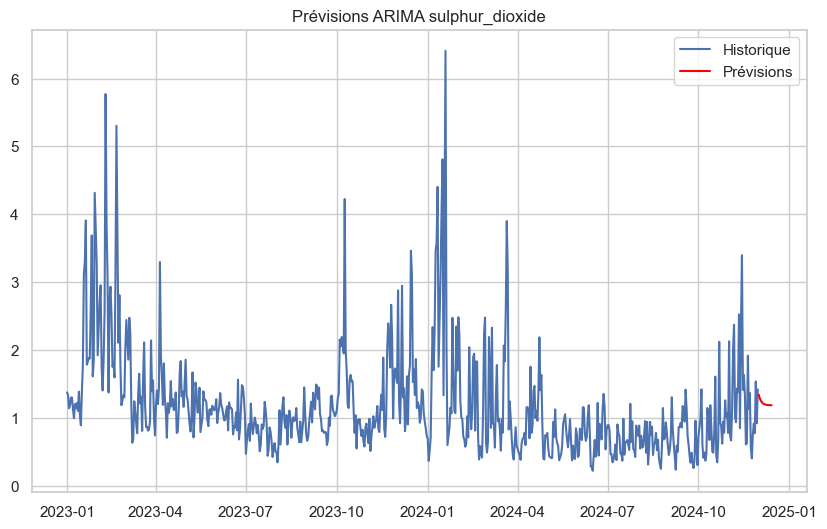

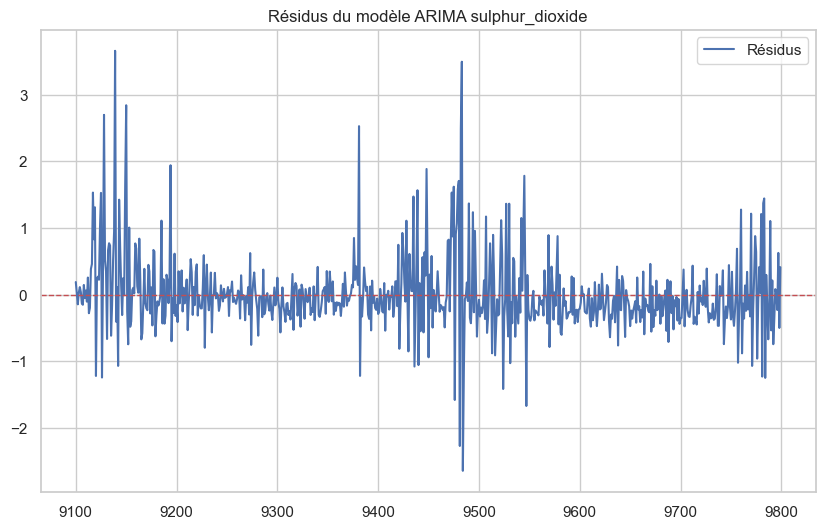

In [188]:
model_fit_sulphur_dioxide = modele.fit_arima(df_idf,"sulphur_dioxide",1,0,0)
modele.prediction_arima(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)
forecast_sulphur_dioxide = modele.prevision_arima(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)
modele.residus(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)

In [189]:
forecast_arima = pd.DataFrame({"pm10" : list(forecast_pm10),
                               "pm2_5" : list(forecast_pm2_5),
                               "ozone" : list(forecast_ozone),
                               "nitrogen_dioxide" : list(forecast_nitrogen_dioxide),
                               "sulphur_dioxide" : list(forecast_sulphur_dioxide)},index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:])

forecast_arima

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
2024-12-01,18.450265,15.669705,44.410037,15.837204,1.342927
2024-12-02,17.117725,14.050125,50.225129,14.603978,1.290895
2024-12-03,16.162074,12.851639,54.788572,13.759201,1.256146
2024-12-04,15.476715,11.964761,58.369774,13.180518,1.232937
2024-12-05,14.985200,11.308474,61.180153,12.784112,1.217437
2024-12-06,14.632703,10.822822,63.385622,12.512569,1.207086
2024-12-07,14.379905,10.463441,65.116383,12.326559,1.200172
2024-12-08,14.198607,10.197500,66.474613,12.199139,1.195554
2024-12-09,14.068586,10.000704,67.540496,12.111855,1.192471
2024-12-10,13.975340,9.855075,68.376956,12.052064,1.190411


On remarque des résultats précédents que les modèles ARIMA "fit" plutôt bien aux données et permettent ainsi de rendre compte du processus générateurs de nos chroniques. De plus, le graphe des résidus indique que les résidus semblent être de moyenne  nulle; ce qui est un indicateur de la qualité du modèle. 
En outre, hormis la vraible d'ozone, les modèles ARIMA prévoient une baisse dans les valeurs des variables de qualité de l'air dans les 2 semaines à venir (01-12-24  --> 14-12-24) 

In [190]:
from sklearn.preprocessing import StandardScaler


### MODELISATION VAR SIMPLE

La modélisation VAR va permettre de prendre en compte les potentielles interactions qui existent entre les variables de qualité de l'air dans l'espoir d'améliorer la qualité de prévision du modèle. 
Pour éviter de données une trop grande importance à certaines variables dans le modèle et éliminer le biais d'échelle, nous allons standardiser au préalable les données de la base


In [191]:
scaler1 = StandardScaler()
df_idf_var1 =  df_idf[['day','pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide']].set_index("day")
df_idf_var1 = pd.DataFrame(scaler1.fit_transform(df_idf_var1), columns=df_idf_var1.columns, index=df_idf_var1.index)
train1 = df_idf_var1

In [192]:
df_idf_var1

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
day,,,,,
2023-01-01,0.240121,-0.008347,-0.787812,-0.556502,0.247064
2023-01-02,-0.630537,-0.514383,-0.663928,0.564945,0.198297
2023-01-03,-0.266617,-0.352220,-0.829107,0.165275,-0.056377
2023-01-04,-1.134287,-0.963228,-0.363065,-0.527416,0.003228
2023-01-05,-1.071543,-0.821335,-0.520379,0.313400,0.149530
...,...,...,...,...,...
2024-11-26,-0.145908,-0.155307,-0.675726,0.167968,-0.348980
2024-11-27,-0.910199,-0.639625,-0.422058,-0.020556,-0.533212
2024-11-28,0.166620,0.502033,-1.259753,0.972695,0.458389


In [193]:
#selection ordre du modèle
from statsmodels.tsa.api import VAR

# Initialiser le modèle
model1 = VAR(train1)

# Sélection de l'ordre optimal
selected_order1 = model1.select_order(maxlags=15)  # Ajustez maxlags en fonction des données
print(selected_order1.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -5.123      -5.090    0.005957      -5.110
1       -8.223     -8.024*   0.0002685      -8.146
2       -8.306      -7.943   0.0002470     -8.165*
3      -8.352*      -7.823  0.0002360*      -8.147
4       -8.341      -7.647   0.0002385      -8.073
5       -8.334      -7.474   0.0002403      -8.001
6       -8.295      -7.270   0.0002498      -7.899
7       -8.256      -7.066   0.0002597      -7.796
8       -8.232      -6.877   0.0002662      -7.708
9       -8.193      -6.672   0.0002768      -7.605
10      -8.177      -6.491   0.0002815      -7.524
11      -8.154      -6.302   0.0002882      -7.437
12      -8.134      -6.117   0.0002941      -7.354
13      -8.129      -5.947   0.0002958      -7.284
14      -8.102      -5.755   0.0003040      -7.194
15      -8.088      -5.575   0.0003087      -7.115
-------------------------------

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [194]:
optimal_lag1 = selected_order1.aic #critère AIC
optimal_lag1

np.int64(3)

In [195]:
# Fitting the VAR model with the optimal lag
#optimal_lag=1
var_model1 = model1.fit(optimal_lag1)

# Summary of the VAR model
var_model1_summary = var_model1.summary()
var_model1_summary

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 24, Dec, 2024
Time:                     16:58:01
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -7.88337
Nobs:                     697.000    HQIC:                  -8.20347
Log likelihood:          -1935.77    FPE:                0.000223701
AIC:                     -8.40524    Det(Omega_mle):     0.000199702
--------------------------------------------------------------------
Results for equation pm10
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                       0.001864         0.025496            0.073           0.942
L1.pm10                     0.435205         0.121308            3.588           0.000
L1.pm2_5                    0.201170 

In [196]:
print(train1.values.shape)  # Nombre de lignes et colonnes
print(var_model1.coefs.shape)  # Dimensions des coefficients

(700, 5)
(3, 5, 5)


In [197]:
# Faire des prédictions
forecast_steps = 14
forecast1 = var_model1.forecast(y=train1.values, steps=forecast_steps)

# Convertir les prévisions en DataFrame
forecast_df1 = pd.DataFrame(forecast1, index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:], columns=df_idf_var1.columns)
forecast_df1



,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
2024-12-01,0.797805,1.268930,-1.335544,0.736502,0.387029
2024-12-02,0.318440,0.721949,-1.077018,0.450633,0.097407
2024-12-03,0.311892,0.653415,-0.926712,0.518988,0.244274
2024-12-04,0.399843,0.707070,-0.835038,0.588659,0.347290
2024-12-05,0.364340,0.640490,-0.732500,0.521741,0.293081
2024-12-06,0.297333,0.540153,-0.641741,0.443521,0.252071
2024-12-07,0.268282,0.481894,-0.569412,0.406228,0.248160
2024-12-08,0.253019,0.442385,-0.505124,0.374214,0.236639
2024-12-09,0.230394,0.398082,-0.447517,0.334878,0.215083
2024-12-10,0.206456,0.354513,-0.397256,0.298607,0.195925


Nous affichons par la suite quelques résultats pour la variable "pm10" . Le résultat est reproductible pour toutes les autres.

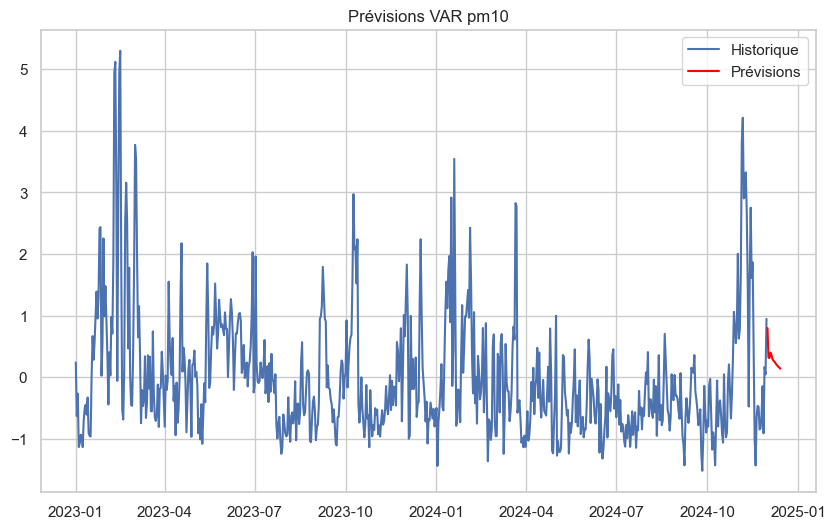

In [198]:
f=modele.prevision_var(df_idf_var1,"pm10",var_model1)

In [199]:
resid1 = var_model1.resid
print(resid1.describe())

               pm10         pm2_5         ozone  nitrogen_dioxide  \
count  6.970000e+02  6.970000e+02  6.970000e+02      6.970000e+02   
mean  -1.197830e-16  2.453004e-17 -2.179032e-16     -7.136010e-17   
std    6.658026e-01  6.384409e-01  6.058187e-01      7.018795e-01   
min   -3.055924e+00 -2.854347e+00 -2.275284e+00     -2.873264e+00   
25%   -3.773204e-01 -3.244857e-01 -3.870399e-01     -3.811657e-01   
50%   -4.788184e-02 -7.253485e-02 -2.223171e-02     -9.600571e-02   
75%    3.241964e-01  2.891281e-01  3.853250e-01      2.758329e-01   
max    3.478839e+00  3.281117e+00  3.173350e+00      4.291531e+00   

       sulphur_dioxide  
count     6.970000e+02  
mean      1.529145e-17  
std       7.136423e-01  
min      -3.295701e+00  
25%      -3.660132e-01  
50%      -8.640386e-02  
75%       2.406278e-01  
max       4.783312e+00  


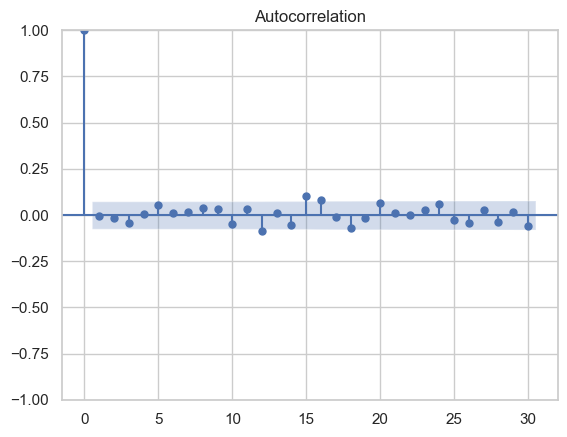

In [200]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(resid1["pm10"], lags=30)
plt.show()

les résidus asociés à chacune de nos variables semblent encore être de moyenne nulle et de plus le graphe des autocorrelations indiquent qu'il se comporte comme un "bruit blanc". Ce qui tends à nous conforter quant à la qualité de notre modèle

### Modelisation VAR avec variables climatiques

Le procédé est le même, à la seule différence que l'on rajoute des variables climatiques dans le but de voir si elle améliore les prévisions du modèle

In [201]:
scaler2 = StandardScaler()
df_idf_var2 =  df_idf[['day','pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide',"temperature_2m", "relative_humidity_2m", "precipitation", "surface_pressure", "wind_speed_10m"]].set_index("day")
df_idf_var2 = pd.DataFrame(scaler2.fit_transform(df_idf_var2), columns=df_idf_var2.columns, index=df_idf_var2.index)
train2 = df_idf_var2

In [202]:
df_idf_var2

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
day,,,,,,,,,,
2023-01-01,0.240121,-0.008347,-0.787812,-0.556502,0.247064,0.096452,-0.674185,-0.176358,-0.053938,1.133370
2023-01-02,-0.630537,-0.514383,-0.663928,0.564945,0.198297,-0.486798,1.110819,1.402707,0.491810,0.116135
2023-01-03,-0.266617,-0.352220,-0.829107,0.165275,-0.056377,-0.862204,1.363247,-0.257336,1.293998,0.575717
2023-01-04,-1.134287,-0.963228,-0.363065,-0.527416,0.003228,-0.221408,1.177189,-0.014402,0.934511,2.160129
2023-01-05,-1.071543,-0.821335,-0.520379,0.313400,0.149530,-0.114100,1.064786,-0.459780,0.953974,0.354028
...,...,...,...,...,...,...,...,...,...,...
2024-11-26,-0.145908,-0.155307,-0.675726,0.167968,-0.348980,-0.714953,1.104284,-0.034647,0.400143,-0.348995
2024-11-27,-0.910199,-0.639625,-0.422058,-0.020556,-0.533212,-0.425528,1.325158,0.673908,0.212840,0.755983
2024-11-28,0.166620,0.502033,-1.259753,0.972695,0.458389,-1.088666,0.637859,-0.540757,1.219469,-1.130912


In [203]:
#selection ordre du modèle
from statsmodels.tsa.api import VAR

# Initialiser le modèle
model2 = VAR(train2)

# Sélection de l'ordre optimal
selected_order2 = model2.select_order(maxlags=15)  # Ajustez maxlags en fonction des données
print(selected_order2.summary())

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -8.373      -8.307   0.0002310      -8.348
1       -15.22     -14.49*   2.455e-07      -14.94
2      -15.50*      -14.11  1.854e-07*     -14.96*
3       -15.47      -13.42   1.910e-07      -14.68
4       -15.35      -12.64   2.154e-07      -14.30
5       -15.26      -11.89   2.358e-07      -13.96
6       -15.14      -11.11   2.675e-07      -13.58
7       -15.07      -10.37   2.882e-07      -13.25
8       -14.93      -9.570   3.330e-07      -12.85
9       -14.78      -8.762   3.876e-07      -12.45
10      -14.69      -8.015   4.247e-07      -12.11
11      -14.59      -7.249   4.749e-07      -11.75
12      -14.50      -6.496   5.254e-07      -11.40
13      -14.53      -5.867   5.140e-07      -11.18
14      -14.42      -5.093   5.818e-07      -10.81
15      -14.36      -4.378   6.226e-07      -10.50
-------------------------------

In [204]:
optimal_lag2 = selected_order2.aic
optimal_lag2

np.int64(2)

In [205]:
# Fitting the VAR model with the optimal lag
#optimal_lag=1
var_model2 = model2.fit(optimal_lag2)

# Summary of the VAR model
var_model2_summary = var_model2.summary()
var_model2_summary

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 24, Dec, 2024
Time:                     16:58:02
--------------------------------------------------------------------
No. of Equations:         10.0000    BIC:                   -14.1825
Nobs:                     698.000    HQIC:                  -15.0218
Log likelihood:          -4266.95    FPE:                1.76374e-07
AIC:                     -15.5508    Det(Omega_mle):     1.31129e-07
--------------------------------------------------------------------
Results for equation pm10
                             coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------------
const                           0.001828         0.025321            0.072           0.942
L1.pm10                         0.511964         0.129600            3.950           0.000
L1.pm2_5             

In [206]:
# Faire des prédictions
forecast_steps = 14
forecast2 = var_model2.forecast(y=train2.values, steps=forecast_steps)

# Convertir les prévisions en DataFrame
forecast_df2 = pd.DataFrame(forecast2, index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:], columns=df_idf_var2.columns)
forecast_df2



,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
2024-12-01,0.994032,1.541363,-1.379793,0.939189,0.564838,-1.318306,1.151068,-0.376896,0.714830,-0.666851
2024-12-02,0.887584,1.372799,-1.191778,0.967894,0.627320,-1.145780,1.068076,-0.278087,0.546904,-0.281230
2024-12-03,0.669086,1.085259,-1.048588,0.811287,0.518430,-1.093040,1.004997,-0.162962,0.499715,-0.121983
2024-12-04,0.477078,0.833642,-0.938856,0.667784,0.437214,-1.064298,0.924052,-0.131218,0.454038,-0.026841
2024-12-05,0.368984,0.679787,-0.851332,0.592667,0.412645,-1.032177,0.846000,-0.125611,0.392610,0.037516
2024-12-06,0.315989,0.591586,-0.783443,0.553414,0.409514,-0.996266,0.783668,-0.113775,0.323322,0.085001
2024-12-07,0.283933,0.530571,-0.729136,0.522948,0.406121,-0.960747,0.733567,-0.096477,0.256297,0.122638
2024-12-08,0.257237,0.479263,-0.683662,0.493324,0.398056,-0.927594,0.690037,-0.079981,0.198311,0.152599
2024-12-09,0.232716,0.433845,-0.644211,0.464783,0.387210,-0.896525,0.650279,-0.066936,0.151821,0.175583
2024-12-10,0.210966,0.394475,-0.609221,0.438541,0.375555,-0.866608,0.613601,-0.057275,0.116190,0.192396


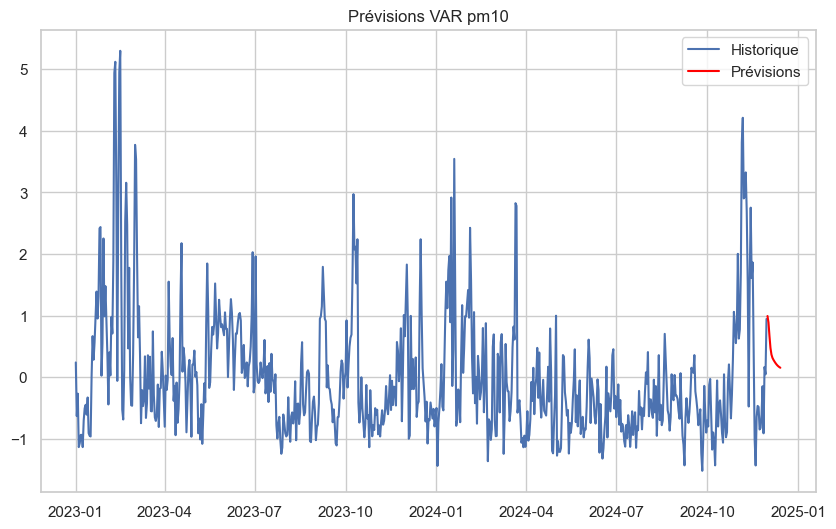

In [207]:
forecast_var_pm10 = modele.prevision_var(df_idf_var2,"pm10",var_model2)

In [208]:
resid2 = var_model2.resid
resid2.describe()

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
count,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02
mean,-2.086838e-16,-1.463331e-16,2.086838e-16,-2.773967e-16,-1.476056e-16,4.771732e-17,-4.097327e-16,4.962601e-17,-1.759179e-16,6.744048e-17
std,6.592677e-01,6.308052e-01,5.930331e-01,6.972590e-01,7.094402e-01,2.897879e-01,6.210809e-01,9.411362e-01,5.000834e-01,7.728735e-01
min,-2.179524e+00,-2.505608e+00,-2.185782e+00,-2.435730e+00,-2.877684e+00,-1.084780e+00,-2.166833e+00,-1.516083e+00,-2.102331e+00,-2.199827e+00
25%,-3.711970e-01,-3.303611e-01,-3.475477e-01,-3.922261e-01,-3.662558e-01,-1.881165e-01,-4.240587e-01,-4.948827e-01,-2.789516e-01,-5.270050e-01
50%,-2.361044e-02,-4.569420e-02,1.556941e-03,-6.925901e-02,-8.259458e-02,-1.611722e-03,-9.435612e-03,-2.452887e-01,3.574991e-02,-4.832202e-02
75%,3.169278e-01,2.719654e-01,3.825202e-01,2.962539e-01,2.461416e-01,1.895849e-01,3.962831e-01,1.162119e-01,2.965753e-01,4.841425e-01
max,2.916892e+00,3.167401e+00,3.003564e+00,4.342526e+00,4.534266e+00,1.202997e+00,2.191644e+00,1.016677e+01,1.762018e+00,2.790366e+00


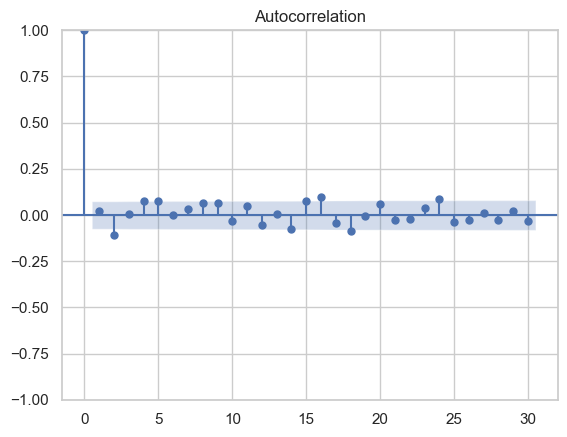

In [209]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(resid2["pm10"], lags=30)
plt.show()

Les interprétations précédentes restent valables

### Evaluation du modèle

la qualité du modèle sera testé en comparant les prévisions faites sur les 2 premières semaine du mois de décembre 2024.

In [210]:
from scripts import api  # Supposez que votre module est `scripts.api`

idf_centroid = [('Île-de-France', 2.503401392552759, 48.70931550109074)]
var_air=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]
test = api.recup_data("2024-12-01","2024-12-14","https://air-quality-api.open-meteo.com/v1/air-quality",var_air,idf_centroid)
test = test[["day","pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]].groupby(['day']).mean().reset_index()

In [211]:
forecast_original_df1 = pd.DataFrame(scaler1.inverse_transform(forecast_df1), columns=forecast_df1.columns)
forecast_original_df1

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
0,19.271896,16.709728,43.394068,17.618750,1.482627
1,15.929430,13.561568,48.871997,15.407397,1.259920
2,15.883773,13.167119,52.056835,15.936161,1.372855
3,16.497022,13.475932,53.999328,16.475104,1.452069
4,16.249474,13.092726,56.172022,15.957460,1.410385
5,15.782251,12.515234,58.095124,15.352384,1.378850
6,15.579688,12.179923,59.627703,15.063907,1.375843
7,15.473270,11.952530,60.989912,14.816260,1.366983
8,15.315511,11.697542,62.210545,14.511976,1.350408
9,15.148595,11.446780,63.275529,14.231397,1.335676


In [212]:
forecast_original_df2 = pd.DataFrame(scaler2.inverse_transform(forecast_df2), columns=forecast_df2.columns)
forecast_original_df2

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,20.640127,18.277719,42.456463,19.186643,1.619355,4.945027,89.404832,0.037892,1017.177424,9.478669
1,19.897894,17.307547,46.440345,19.408696,1.667401,6.006828,88.592301,0.058229,1015.563321,11.679534
2,18.374378,15.652605,49.474404,18.197254,1.583669,6.331416,87.974738,0.081924,1015.109736,12.588412
3,17.035559,14.204415,51.799524,17.087182,1.521217,6.508303,87.182258,0.088457,1014.670691,13.131421
4,16.281857,13.318901,53.654073,16.506110,1.502325,6.705990,86.418097,0.089611,1014.080243,13.498723
5,15.912338,12.811261,55.092588,16.202463,1.499917,6.927004,85.807843,0.092047,1013.414250,13.769738
6,15.688820,12.460086,56.243291,15.966792,1.497308,7.145607,85.317336,0.095607,1012.770007,13.984544
7,15.502675,12.164784,57.206848,15.737638,1.491106,7.349646,84.891159,0.099003,1012.212642,14.155541
8,15.331698,11.903378,58.042782,15.516857,1.482766,7.540854,84.501918,0.101688,1011.765784,14.286719
9,15.180044,11.676784,58.784194,15.313860,1.473804,7.724980,84.142825,0.103676,1011.423299,14.382674


In [213]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE ARIMA {} : {}". format(col,root_mean_squared_error(forecast_arima[col], test[col])))

RMSE ARIMA pm10 : 11.936035181230721
RMSE ARIMA pm2_5 : 11.722040224449525
RMSE ARIMA ozone : 31.84866918301274
RMSE ARIMA nitrogen_dioxide : 12.009202631389586
RMSE ARIMA sulphur_dioxide : 1.285922529897157


In [214]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE VAR 1 {} : {}". format(col,root_mean_squared_error(forecast_original_df1[col], test[col])))


RMSE VAR 1 pm10 : 11.755225415313879
RMSE VAR 1 pm2_5 : 11.396719705413181
RMSE VAR 1 ozone : 28.48056539384142
RMSE VAR 1 nitrogen_dioxide : 11.369552893268846
RMSE VAR 1 sulphur_dioxide : 1.2444368308686495


In [215]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE VAR 2 {} : {}". format(col,root_mean_squared_error(forecast_original_df2[col], test[col])))

RMSE VAR 2 pm10 : 11.81854627741567
RMSE VAR 2 pm2_5 : 11.46697465635846
RMSE VAR 2 ozone : 25.404805768341326
RMSE VAR 2 nitrogen_dioxide : 11.14792070722371
RMSE VAR 2 sulphur_dioxide : 1.2018210466463766


| RMSE Modele      | pm10   | pm2_5  | ozone  | nitrogen_dioxide | sulphur_dioxide |
|----------------|---------|--------|--------|------------------|-----------------|
| ARIMA          | 11.936 | 11.722 | 20.763 | 12.009           | 1.286           |
| VAR 1          | 11.794 | 11.448 | 19.891 | 11.384           | 1.250           |
| VAR 2          | 11.837 | 11.476 | 18.822 | 11.107           | 1.201           |


Dans le but d'avoir une idée synthétique des performances de nos modèles vis à vis de la prévision de la qualité de l'air, nous allons construire une moyenne synthétique des erreurs de prévision sur les différentes variables climatiques. L'originalité de cet indicateur est qu'il agrège les RMSE pour les 5 variables de qualité de l'air en les pondérant par l'inverse de la moyenne de chacune de ces variables.\
intuition : une RMSE de 1.5 sur une variable de moyenne 1 est de loin très critique qu'une RMSE de 1.5 sur une variable de moyenne 100000.

In [216]:
from scripts import modele
import importlib
importlib.reload(modele)

<module 'scripts.modele' from 'c:\\Users\\steph\\Documents\\ENSAE\\Python pour la data science\\Projet_Python_2024-1\\scripts\\modele.py'>

In [217]:
indice_arima = 0 
sum_inv_mean = 0
for col in polluants : 
    indice_arima = indice_arima + (root_mean_squared_error(forecast_arima[col], test[col])/ df_final[col].mean())
    sum_inv_mean=sum_inv_mean + 1/(df_final[col].mean())
indice_arima = indice_arima/sum_inv_mean
print(indice_arima)

3.2007177617698215


In [218]:
indice_arima = modele.indice_eval(polluants=polluants,forecast=forecast_arima,data=df_final,test=test)
indice_arima

np.float64(3.2007177617698215)

In [219]:
indice_var1 = modele.indice_eval(polluants=polluants,forecast=forecast_original_df1,data=df_final,test=test)
indice_var1

np.float64(3.0751056681713282)

In [220]:
indice_var2 = modele.indice_eval(polluants=polluants,forecast=forecast_original_df2,data=df_final,test=test)
indice_var2

np.float64(3.0124634901480616)

|  Modele      | RMSE Synthétique|
|----------------|---------|
| ARIMA          | 3.2007177617698215|
| VAR 1          | 3.0751056681713282 |
| VAR 2          | 3.0124634901480616 |

En utilisant l'indice synthétique d'erreur de prévision sur l'ensemble des variables de prévision, on remarque que l' erreur de prévision synthétique est plus faible dans le modèle VAR 1 -- modèle VAR uniquement avec les variables de qualités de l'air-- que dans la modélisation ARIMA. De plus on note une baisse de cette erreur de prévision dans le modèle VAR 2 -- modèle VAR avec intégration de variables climatiques 

* L'ajout des autres variables de qualités de l'air améliore les prévisions par rapport à des modèles temporelles individuels. Ceci pourrait s'explique par la'interdépendance entre les variables qui caractérisent la qualité de l'air 

* De plus, la prise en compte de variables climatiques dans la modélisation améliore aussi la qualité prédictive du modèle.

## Limites de l'étude